<a href="https://colab.research.google.com/github/immanuelobani/Space-Weather-Data-Visualisation/blob/main/Space_Weather_Visualisation.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

In [ ]:
from google.colab import drive
drive.mount('/content/drive')

Mounted at /content/drive


In [ ]:
import pandas as pd
import re
import matplotlib.pyplot as plt
import seaborn as sns
import numpy as np
from datetime import datetime

## Dataset Loading and Cleaning

load data

### Loading Dataset

In [ ]:

#flares = pd.read_fwf("/content/drive/MyDrive/flares1981-2017.txt",  header=None)
spots = pd.read_fwf("/content/drive/MyDrive/spots1981-2017.txt", header=None)


### Preview Flares Dataset

preprocess data


In [ ]:
spots.head()

,0,1,2,3,4,5,6,7,8,9,10,11,12
0,11811201,21,N13W46 BG,NaN,NaN,3478 EKI,32.0,12.0,600.0,811127.5,811127.5,938,4LEAR
1,11811201,115,N13W46,NaN,NaN,3478 EHI,16.0,11.0,530.0,811127.6,811127.5,205,2MANI
2,11811201,210,N12W47 BG,NaN,NaN,3478 EHO,22.0,14.0,710.0,811127.5,811127.5,626,2PALE
3,11811201,1355,N15W56 BG,NaN,NaN,3478 EHI,31.0,13.0,670.0,811127.3,811127.5,468,2RAMY
4,11811201,1535,N13W55 BG,NaN,NaN,3478 EHI,17.0,13.0,430.0,811127.5,811127.5,624,2HOLL


In [ ]:
spots.drop(axis=1, labels=[2,3,7,9], inplace=True)

In [ ]:
# Dropping columns by index
spots.drop(spots.columns[[2, 3, 4, 7, 9]], axis=1, inplace=True)

# Saving the modified DataFrame to a new CSV file
spots.to_csv('/content/drive/MyDrive/modified_spots.csv', index=False)  # 'index=False' omits the index from the CSV


Int64Index([0, 1, 5, 6, 8], dtype='int64')

In [ ]:
flares = pd.read_csv('/content/drive/MyDrive/flares.csv')

In [ ]:
flares.head()

,Date,Time,X-ray Class,Flare Magnititude,NOAA
0,31777810102,441,C,18.0,NaN
1,31777810102,955,C,18.0,NaN
2,31777810103,1025,C,51.0,NaN
3,31777810103,1549,C,22.0,2857.0
4,31777810103,1837,C,22.0,NaN


In [ ]:
print(flares[['Date', 'Time']].head())

          Date  Time
0  31777810102   441
1  31777810102   955
2  31777810103  1025
3  31777810103  1549
4  31777810103  1837


In [ ]:
# Convert 'Time' to string and pad with zeros to ensure 4 digits
flares['Time'] = flares['Time'].astype(str).str.zfill(4)


In [ ]:
flares.head()

,Date,Time,X-ray Class,Flare Magnititude,NOAA
0,31777810102,0441,C,18.0,NaN
1,31777810102,0955,C,18.0,NaN
2,31777810103,1025,C,51.0,NaN
3,31777810103,1549,C,22.0,2857.0
4,31777810103,1837,C,22.0,NaN


In [ ]:
# Load the dataset
flares = pd.read_csv('/content/drive/MyDrive/__flares.csv')
spots = pd.read_csv('/content/drive/MyDrive/__spots.csv')

flares.head()

<ipython-input-3-93d65be30b94>:3: DtypeWarning: Columns (5) have mixed types. Specify dtype option on import or set low_memory=False.
  spots = pd.read_csv('/content/drive/MyDrive/__spots.csv')


,Date,Start Time,End Time,Time,X-ray Class,Flare Magnitude,Latitude,Longitude,NOAA,Flare Duration,Year
0,03/01/1981,03/01/1981 21:49,03/01/1981 22:09,21:59,C,12,-5,-671,2857,20,1981
1,03/01/1981,03/01/1981 22:17,03/01/1981 22:37,22:27,C,20,14,-78,2866,20,1981
2,04/01/1981,04/01/1981 16:41,04/01/1981 17:01,16:51,C,22,11,-86,2872,20,1981
3,05/01/1981,05/01/1981 13:48,05/01/1981 14:08,13:58,C,18,-14,47,2875,20,1981
4,06/01/1981,06/01/1981 05:43,06/01/1981 06:03,05:53,C,25,-17,39,2875,20,1981


In [ ]:
# Drop all rows with missing values
flares.dropna(inplace=True)

# Optionally, you might want to reset the index after dropping rows
flares.reset_index(drop=True, inplace=True)

In [ ]:
import pandas as pd

def has_index(list, index):
    try:
        item = list[index]
        return item
    except IndexError:
        return False

# Define the functions
def get_date(value):
    date_data = str(value)[-6:]
    base_year = date_data[:2]
    prefix = '20' if int(base_year) < 18 else '19'
    year = prefix + base_year
    return year + '-' + date_data[2:4] + '-' + date_data[4:6]

def get_time(value):
    value = str(value)
    return (value[:-2] if value[:-2] != "" else "00") + ":" + value[-2:]

from datetime import datetime

def is_valid_datetime(dt_str):
    try:
        # Attempt to parse the value as a valid datetime
        datetime.strptime(dt_str, '%Y-%m-%d %H:%M:%S')
        return True
    except ValueError:
        return False

In [ ]:
flares.head()

,Date,Time,Location,X-ray Class,Flare Magnitude,NOAA
0,31777810103,2159,S05W671N,C,12.0,2857.0
1,31777810103,2227,N14W78SN,C,20.0,2866.0
2,31777810104,1651,N11W86SN,C,22.0,2872.0
3,31777810105,1358,S14E47SN,C,18.0,2875.0
4,31777810106,553,S17E39SB,C,25.0,2875.0


In [ ]:
def parse_location(Location):
    # Check if the Location is a string
    if not isinstance(Location, str):
        return 0, 0  # Return a default value for non-string inputs

    for i, char in enumerate(Location):
        if char.isdigit() and (Location[i+1] == 'E' or Location[i+1] == 'W'):
            lat_split_point = i + 1
            break
    else:
        return 0, 0  # Return a default value if the format is not as expected

    lat_hemisphere = 1 if Location[0] == 'N' else -1
    latitude = lat_hemisphere * int(Location[1:lat_split_point])

    # Find where the longitude part ends (first non-digit character after the longitude hemisphere)
    for i, char in enumerate(Location[lat_split_point + 1:], start=lat_split_point + 1):
        if not char.isdigit():
            long_split_point = i
            break
    else:
        long_split_point = len(Location)

    long_hemisphere = -1 if Location[lat_split_point] == 'W' else 1
    longitude = long_hemisphere * int(Location[lat_split_point + 1:long_split_point])

    return latitude, longitude


# Apply the function to each row in the DataFrame
flares[['Latitude', 'Longitude']] = flares['Location'].apply(
    lambda x: pd.Series(parse_location(x))
)

### Clean & Label Flares Datasets

In [ ]:
# Apply the functions to 'Date' and 'Time' columns
flares['Date'] = flares['Date'].apply(get_date)
flares['Time'] = flares['Time'].apply(get_time)

# Convert 'Time' to string and pad with zeros to ensure 4 digits
flares['Time'] = flares['Time'].astype(str).str.zfill(4)

# Infer 'Start Time' and 'End Time' based on 'Time' (Peak Time)
# This is placeholder logic; adjust according to your actual requirements
flares['Start Time'] = pd.to_datetime(flares['Time'], format='%H:%M') - pd.Timedelta(minutes=10)
flares['Start Time'] = flares['Start Time'].dt.time
flares['End Time'] = pd.to_datetime(flares['Time'], format='%H:%M') + pd.Timedelta(minutes=10)
flares['End Time'] = flares['End Time'].dt.time

# Convert 'Start Time' and 'End Time' to string
flares['Start Time'] = flares['Start Time'].astype(str)
flares['End Time'] = flares['End Time'].astype(str)

# Remove ":00" from 'Start Time' and 'End Time'
flares['Start Time'] = flares['Start Time'].str.rstrip(':00')
flares['End Time'] = flares['End Time'].str.rstrip(':00')


# Handle missing values for 'NOAA' column, if applicable
flares['NOAA'] = flares['NOAA'].fillna(method='ffill')

# Rearrange columns as per your requirement
flares = flares[['Date', 'Start Time', 'End Time', 'Time', 'X-ray Class', 'Flare Magnitude', 'Latitude','Longitude','NOAA']]

# Reset index
flares.reset_index(drop=False, inplace=True)

# Save the processed dataset to a new CSV file
processed_file_path = '/content/drive/MyDrive/processed_flares.csv'
flares.to_csv(processed_file_path, index=False)

In [ ]:
flares.head()

,index,Date,Start Time,End Time,Time,X-ray Class,Flare Magnitude,Latitude,Longitude,NOAA
0,0,1981-01-03,21:49,22:09,21:59,C,12.0,-5,-671,2857.0
1,1,1981-01-03,22:17,22:37,22:27,C,20.0,14,-78,2866.0
2,2,1981-01-04,16:41,17:01,16:51,C,22.0,11,-86,2872.0
3,3,1981-01-05,13:48,14:08,13:58,C,18.0,-14,47,2875.0
4,4,1981-01-06,05:43,06:03,5:53,C,25.0,-17,39,2875.0


In [ ]:
flares['Flare Magnitude'].max()

99.0

### Modify Flares DataSet

In [ ]:
# Filter out rows with invalid 'Start Time' values
flares = flares[flares['Start Time'].str.contains(':')]
flares = flares[flares['End Time'].str.contains(':')]


# Convert 'Start Time' to datetime
flares['Start Time'] = pd.to_datetime(flares['Date'] + ' ' + flares['Start Time'])

# Concatenate 'Date' and 'Start Time' into 'Start Time' as datetime


# Concatenate 'Date' and 'End Time' into 'End Time' as datetime
flares['End Time'] = pd.to_datetime(flares['Date'] + ' ' + flares['End Time'])

# Calculate 'Flare Duration' in minutes
flares['Flare Duration'] = (flares['End Time'] - flares['Start Time']).dt.total_seconds() / 60

# Convert 'Date' to datetime
flares['Date'] = pd.to_datetime(flares['Date'])

# Extract the 'Year' from 'Date'
flares['Year'] = flares['Date'].dt.year

# Convert 'NOAA' to string
flares['NOAA'] = flares['NOAA'].astype(str)

# Drop the 'index' column if it exists
if 'index' in flares.columns:
    flares.drop(columns=['index'], inplace=True)

# Display the modified DataFrame
flares.head()

,Date,Start Time,End Time,Time,X-ray Class,Flare Magnitude,Latitude,Longitude,NOAA,Flare Duration,Year
0,1981-01-03,1981-01-03 21:49:00,1981-01-03 22:09:00,21:59,C,12.0,-5,-671,2857.0,20.0,1981
1,1981-01-03,1981-01-03 22:17:00,1981-01-03 22:37:00,22:27,C,20.0,14,-78,2866.0,20.0,1981
2,1981-01-04,1981-01-04 16:41:00,1981-01-04 17:01:00,16:51,C,22.0,11,-86,2872.0,20.0,1981
3,1981-01-05,1981-01-05 13:48:00,1981-01-05 14:08:00,13:58,C,18.0,-14,47,2875.0,20.0,1981
4,1981-01-06,1981-01-06 05:43:00,1981-01-06 06:03:00,5:53,C,25.0,-17,39,2875.0,20.0,1981


In [ ]:
flares.head()

,Date,Start Time,End Time,Time,X-ray Class,Flare Magnitude,Latitude,Longitude,NOAA,Flare Duration,Year
0,1981-01-03,1981-01-03 21:49:00,1981-01-03 22:09:00,21:59,C,12.0,-5,-671,2857.0,20.0,1981
1,1981-01-03,1981-01-03 22:17:00,1981-01-03 22:37:00,22:27,C,20.0,14,-78,2866.0,20.0,1981
2,1981-01-04,1981-01-04 16:41:00,1981-01-04 17:01:00,16:51,C,22.0,11,-86,2872.0,20.0,1981
3,1981-01-05,1981-01-05 13:48:00,1981-01-05 14:08:00,13:58,C,18.0,-14,47,2875.0,20.0,1981
4,1981-01-06,1981-01-06 05:43:00,1981-01-06 06:03:00,5:53,C,25.0,-17,39,2875.0,20.0,1981


In [ ]:
flares.to_csv('/content/drive/MyDrive/__flares.csv', index=False)  # 'index=False' omits the index from the CSV

In [ ]:
def get_macintosh_class(value):
    value_list = str(value).split(' ')
    if has_index(value_list, 1) is not False:
        expected_mcintosh_class = str(value_list[1])
        if re.match(r"^[A-Z]{2,3}$", expected_mcintosh_class):
            return expected_mcintosh_class
        return float('nan')
    return float('nan')

def get_spot_noaa(value):
    value_list = str(value).split(' ')
    if has_index(value_list, 1) is not False:
        return value_list[0]
    return float('nan')

In [ ]:
spots.head()

,0,1,2,3,4,5,6,7,8,9,10,11,12
0,11811201,21,N13W46 BG,NaN,NaN,3478 EKI,32.0,12.0,600.0,811127.5,811127.5,938,4LEAR
1,11811201,115,N13W46,NaN,NaN,3478 EHI,16.0,11.0,530.0,811127.6,811127.5,205,2MANI
2,11811201,210,N12W47 BG,NaN,NaN,3478 EHO,22.0,14.0,710.0,811127.5,811127.5,626,2PALE
3,11811201,1355,N15W56 BG,NaN,NaN,3478 EHI,31.0,13.0,670.0,811127.3,811127.5,468,2RAMY
4,11811201,1535,N13W55 BG,NaN,NaN,3478 EHI,17.0,13.0,430.0,811127.5,811127.5,624,2HOLL


## Preview Spots Dataset

In [ ]:
spots.drop(axis=1, labels=[3,4,7,8,9,10,11,12], inplace=True)

# Saving the modified DataFrame to a new CSV file
spots.to_csv('/content/drive/MyDrive/modified_spots.csv', index=False)  # 'index=False' omits the index from the CSV

## Clean & Label Spots Dataset

In [ ]:
# Drop the specified columns except the one at index 2
# Adjust the list of labels to drop based on the column you want to keep
spots.drop(axis=1, labels=[3,4,7,8,9,10,11,12], inplace=True)

# Rename the columns
# Make sure to include 'Location' at the correct position based on the column you retained
# The number of items in this list should match the number of columns after dropping
spots.columns = ['Date', 'Time', 'Location', 'McIntosh & NOAA', 'Number of Spots']

# Continue with your processing
rows_with_bad_time = spots.loc[spots['Time'] > 2359]
spots['McIntosh Class'] = spots['McIntosh & NOAA'].apply(get_macintosh_class)
spots['NOAA'] = spots['McIntosh & NOAA'].apply(get_spot_noaa)
spots.drop('McIntosh & NOAA', axis=1, inplace=True)
spots.drop(rows_with_bad_time.index, inplace=True)
spots['Zurich Class'] = spots['McIntosh Class'].apply(lambda x: str(x)[:1])
spots['Penumbra Class'] = spots['McIntosh Class'].apply(lambda x: str(x)[1:2])
spots['Compactness Class'] = spots['McIntosh Class'].apply(lambda x: str(x)[2:3] if len(str(x)) > 2 else float('nan'))
spots.dropna(inplace=True)

# Display the first few rows to confirm the column structure
spots.head()

,Date,Time,Location,Number of Spots,McIntosh Class,NOAA,Zurich Class,Penumbra Class,Compactness Class
0,11811201,21,N13W46 BG,32.0,EKI,3478,E,K,I
1,11811201,115,N13W46,16.0,EHI,3478,E,H,I
2,11811201,210,N12W47 BG,22.0,EHO,3478,E,H,O
3,11811201,1355,N15W56 BG,31.0,EHI,3478,E,H,I
4,11811201,1535,N13W55 BG,17.0,EHI,3478,E,H,I


In [ ]:
def parse_location(Location):
    # Check if the Location is a string
    if not isinstance(Location, str):
        return 0, 0  # Return a default value for non-string inputs

    for i, char in enumerate(Location):
        if char.isdigit() and (Location[i+1] == 'E' or Location[i+1] == 'W'):
            lat_split_point = i + 1
            break
    else:
        return 0, 0  # Return a default value if the format is not as expected

    lat_hemisphere = 1 if Location[0] == 'N' else -1
    latitude = lat_hemisphere * int(Location[1:lat_split_point])

    # Find where the longitude part ends (first non-digit character after the longitude hemisphere)
    for i, char in enumerate(Location[lat_split_point + 1:], start=lat_split_point + 1):
        if not char.isdigit():
            long_split_point = i
            break
    else:
        long_split_point = len(Location)

    long_hemisphere = -1 if Location[lat_split_point] == 'W' else 1
    longitude = long_hemisphere * int(Location[lat_split_point + 1:long_split_point])

    return latitude, longitude


# Apply the function to each row in the DataFrame
spots[['Latitude', 'Longitude']] = spots['Location'].apply(
    lambda x: pd.Series(parse_location(x))
)

### Update & Modify Spots DataSet

In [ ]:
spots['Number of Spots'] = spots['Number of Spots'].apply(int)
spots['Date'] = spots['Date'].apply(get_date)
spots['Time'] = spots['Time'].apply(get_time)
spots['DateTime'] = spots['Date'].str.cat(spots['Time'], sep=' ')
spots['DateTime'] = pd.to_datetime(spots['DateTime'])
spots['Date'] = pd.to_datetime(spots['Date'])
spots['Year'] = spots['Date'].dt.year
spots['Zurich Class'] = spots['Zurich Class'].apply(str)
spots['Penumbra Class'] = spots['Penumbra Class'].apply(str)
spots['Compactness Class'] = spots['Compactness Class'].apply(str)
spots.sort_values(by=['DateTime'], ascending=True, inplace=True)
spots.head()

,Date,Time,Location,Number of Spots,McIntosh Class,NOAA,Zurich Class,Penumbra Class,Compactness Class,Latitude,Longitude,DateTime,Year
0,1981-12-01,00:21,N13W46 BG,32,EKI,3478,E,K,I,13,-46,1981-12-01 00:21:00,1981
79,1981-12-01,00:21,S15E28 B,8,CRO,3481,C,R,O,-15,28,1981-12-01 00:21:00,1981
72,1981-12-01,00:21,N12E12 B,5,BXO,3488,B,X,O,12,12,1981-12-01 00:21:00,1981
140,1981-12-01,00:21,S20E58 B,6,BXO,3486,B,X,O,-20,58,1981-12-01 00:21:00,1981
167,1981-12-01,00:21,N19E64 B,9,DSO,3485,D,S,O,19,64,1981-12-01 00:21:00,1981


In [ ]:
# Saving the modified DataFrame to a new CSV file
spots.to_csv('/content/drive/MyDrive/__spots.csv', index=False)  # 'index=False' omits the index from the CSV

In [ ]:
# Selecting flares data of only solar cycle 22 (1996 - 2008)
flares = flares[(flares['Date'].dt.year >= 1986) & (flares['Date'].dt.year <= 1996)]
flares.head()

AttributeError: Can only use .dt accessor with datetimelike values

In [ ]:
# Selecting spots data of only solar cycle 22 (1996 - 2008)
spots = spots[(spots['Date'].dt.year >= 1986) & (spots['Date'].dt.year <= 1996)]
spots.head()

,Date,Time,Number of Spots,McIntosh Class,NOAA,Zurich Class,Penumbra Class,Compactness Class,DateTime,Year
37111,1986-01-13,2:25,1,AXX,4710,A,X,X,1986-01-13 02:25:00,1986
37112,1986-01-13,7:40,4,CRO,4710,C,R,O,1986-01-13 07:40:00,1986
37113,1986-01-13,13:35,12,DAO,4710,D,A,O,1986-01-13 13:35:00,1986
37114,1986-01-13,15:25,3,DSO,4710,D,S,O,1986-01-13 15:25:00,1986
37116,1986-01-13,17:07,12,DSO,4710,D,S,O,1986-01-13 17:07:00,1986


## Extracting flares based on X-ray class into a new dataset

In [ ]:
significant_flares = flares[(flares['X-ray Class'] == 'X') | (flares['X-ray Class'] == 'M')]
significant_flares.head()

,Date,Start Time,End Time,Time,X-ray Class,Flare Magnitude,Latitude,Longitude,NOAA,Flare Duration,Year
6136,1986-01-15,1986-01-15 06:44:00,1986-01-15 07:04:00,6:54,M,11.0,-9,-671,4710.0,20.0,1986
6139,1986-01-16,1986-01-16 16:06:00,1986-01-16 16:26:00,16:16,M,66.0,-9,-86,4710.0,20.0,1986
6140,1986-01-16,1986-01-16 18:27:00,1986-01-16 18:47:00,18:37,M,13.0,-12,-88,4710.0,20.0,1986
6149,1986-02-03,1986-02-03 20:27:00,1986-02-03 20:47:00,20:37,M,23.0,-9,261,4711.0,20.0,1986
6153,1986-02-04,1986-02-04 07:25:00,1986-02-04 07:45:00,7:35,X,30.0,-3,213,4711.0,20.0,1986


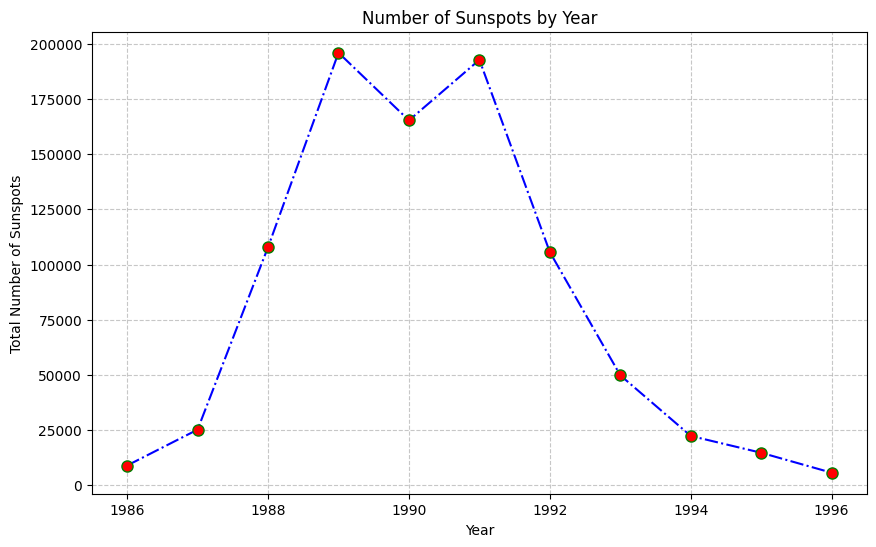

In [ ]:
import pandas as pd
import matplotlib.pyplot as plt

# Assuming 'sunspots' is your DataFrame containing the sunspot data
# You would need to ensure that 'Date' and 'Number of Spots' columns exist in your DataFrame

# Convert the 'Date' column to datetime
spots['Date'] = pd.to_datetime(spots['Date'])

# Set the 'Date' column as the index
spots.set_index('Date', inplace=True)

# Group the data by year, assuming your DataFrame is indexed by datetime
# Count the number of sunspot events per year
yearly_counts = spots.resample('A')['Number of Spots'].sum()

# Plotting a line chart with markers for the yearly sunspot count
plt.figure(figsize=(10, 6))
plt.plot(
    yearly_counts.index.year,  # X-axis values: years
    yearly_counts.values,      # Y-axis values: counts
    marker='o',                # Marker shape
    markerfacecolor='r',       # Marker fill color
    markeredgecolor='g',       # Marker edge color
    color='blue',              # Line color
    linestyle='-.',            # Line style
    markersize=8)              # Marker size

# Customize the layout
plt.title('Number of Sunspots by Year')
plt.xlabel('Year')
plt.ylabel('Total Number of Sunspots')
plt.grid(axis='both', linestyle='--', alpha=0.7)

# Save the plot to a file
plt.savefig('sunspot_count_by_year.png')

# Show the plot
plt.show()


In [ ]:
pip install --upgrade plotly pandas


     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 15.6/15.6 MB 66.0 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 12.3/12.3 MB 72.6 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 346.6/346.6 kB 33.8 MB/s eta 0:00:00
  Attempting uninstall: plotly
    Found existing installation: plotly 5.15.0
    Uninstalling plotly-5.15.0:
      Successfully uninstalled plotly-5.15.0
  Attempting uninstall: pandas
    Found existing installation: pandas 1.5.3
    Uninstalling pandas-1.5.3:
      Successfully uninstalled pandas-1.5.3
ERROR: pip's dependency resolver does not currently take into account all the packages that are installed. This behaviour is the source of the following dependency conflicts.
lida 0.0.10 requires fastapi, which is not installed.
lida 0.0.10 requires kaleido, which is not installed.
lida 0.0.10 requires python-multipart, which is not installed.
lida 0.0.10 requires uvicorn, which is not installed.
bigframes 0.17.0 requires pandas<2.1.4,>=1.5.0, 

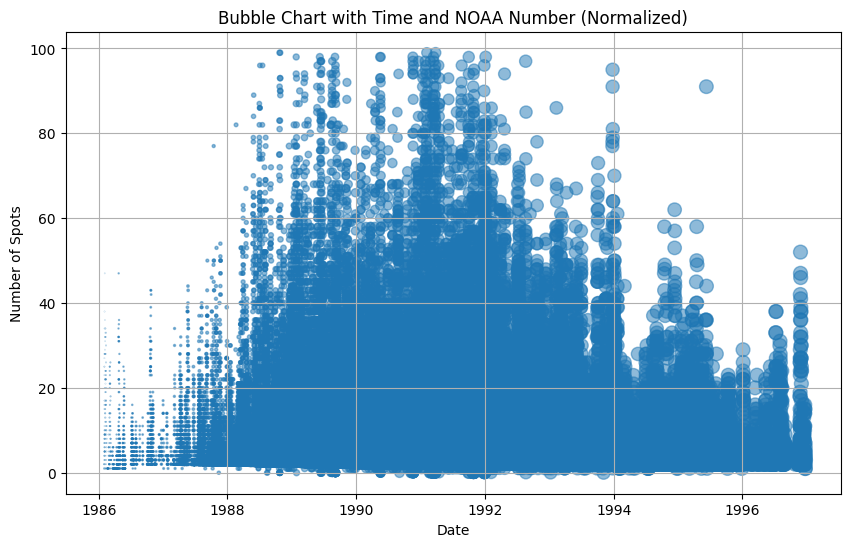

In [ ]:
import matplotlib.pyplot as plt
import pandas as pd

# Convert 'NOAA Number' column to numeric
spots['NOAA'] = pd.to_numeric(spots['NOAA'], errors='coerce')

# Normalize the 'NOAA Number' column for bubble size
normalized_noaa = (spots['NOAA'] - spots['NOAA'].min()) / (spots['NOAA'].max() - spots['NOAA'].min())

# Bubble chart
plt.figure(figsize=(10, 6))
plt.scatter(
    spots['Date'],
    spots['Number of Spots'],
    s=normalized_noaa * 100,  # Bubble size representing normalized NOAA Number
    alpha=0.5,
)
plt.xlabel('Date')
plt.ylabel('Number of Spots')
plt.title('Bubble Chart with Time and NOAA Number (Normalized)')
plt.grid(True)
plt.show()


In [ ]:
max_latitude = flares['Latitude'].max()
max_longitude = flares['Longitude'].max()

print(f"Max Latitude: {max_latitude}")
print(f"Max Longitude: {max_longitude}")


Max Latitude: 44
Max Longitude: 932


In [ ]:
from sklearn.cluster import KMeans
from sklearn.preprocessing import StandardScaler
import numpy as np
import plotly.express as px
import pandas as pd

# Mapping X-ray classes to numeric values for clustering
class_mapping = {'A': 0, 'B': 1, 'C': 2, 'M': 3, 'X': 4}
flares['Xray_Class_Num'] = flares['X-ray Class'].map(class_mapping)

true_labels = flares['X-ray Class'].map(class_mapping)  #

# Selecting features for clustering
features_for_clustering = flares[['Xray_Class_Num', 'Flare Magnitude']]

# Standardize the features
scaler = StandardScaler()
features_scaled = scaler.fit_transform(features_for_clustering)

# Apply KMeans clustering
n_clusters = 5
kmeans = KMeans(n_clusters=n_clusters, random_state=42)
Cluster_labels = kmeans.fit_predict(features_scaled)
flares['cluster'] = Cluster_labels

# Convert Longitude & Latitude to 2D Cartesian Coordinates for visualization
flares['x'] = np.cos(np.radians(flares['Latitude'])) * np.cos(np.radians(flares['Longitude']))
flares['y'] = np.cos(np.radians(flares['Latitude'])) * np.sin(np.radians(flares['Longitude']))
flares['z'] = flares['Flare Magnitude']  # Use the sine of latitude for Z coordinate

# Create a 3D scatter plot using the original X-ray class for coloring
fig = px.scatter_3d(flares, x='x', y='y', z='z', color='X-ray Class',
                    title="3D Visualization of Solar Flare Clusters by Actual X-ray Class",
                    labels={'x': 'Longitude Coordinate', 'y': 'Latitude Coordinate', 'z': 'Flare Magnitude'})

# Adjust the size of the visualization
fig.update_layout(width=1000, height=800)

# Update hover information to display actual longitude and latitude
fig.update_traces(
    hovertemplate='Longitude: %{customdata[0]:.2f}<br>Latitude: %{customdata[1]:.2f}<br>X-ray Class: %{text}',
    customdata=np.column_stack((flares['Longitude'], flares['Latitude'])),
    text=flares['X-ray Class']
)

fig.show()


/usr/local/lib/python3.10/dist-packages/sklearn/cluster/_kmeans.py:870: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  warnings.warn(


In [ ]:
pip install cartopy

     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 11.8/11.8 MB 23.0 MB/s eta 0:00:00


In [ ]:
import pandas as pd
import plotly.express as px


# Convert time columns to datetime
flares['Start Time'] = pd.to_datetime(flares['Start Time'])

# Create an interactive time series plot
fig = px.line(flares, x='Start Time', y='Flare Magnitude', title='Solar Flare Magnitude Over Time')
fig.show()


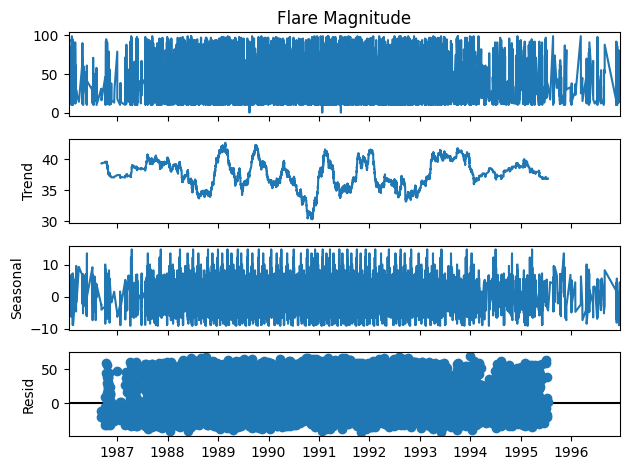

In [ ]:
from statsmodels.tsa.seasonal import seasonal_decompose
import matplotlib.pyplot as plt

# Assuming 'Start Time' and 'Flare Magnitude' are columns in your DataFrame
flares.set_index('Start Time', inplace=True)
result = seasonal_decompose(flares['Flare Magnitude'], model='additive', period=365)
result.plot()
plt.show()

In [ ]:
import numpy as np
import plotly.express as px
import pandas as pd
from sklearn.metrics import silhouette_score, calinski_harabasz_score, davies_bouldin_score

# Your flares DataFrame should be defined here, with 'X-ray Class' and 'Flare Magnitude' columns available.
# The features_scaled array should also be defined based on your clustering features.

# Mapping X-ray classes to numeric values for visualization purposes
class_mapping = {'A': 0, 'B': 1, 'C': 2, 'M': 3, 'X': 4}
flares['Xray_Class_Num'] = flares['X-ray Class'].map(class_mapping)

# Convert Longitude & Latitude to 2D Cartesian Coordinates for visualization
flares['x'] = np.cos(np.radians(flares['Latitude'])) * np.cos(np.radians(flares['Longitude']))
flares['y'] = np.cos(np.radians(flares['Latitude'])) * np.sin(np.radians(flares['Longitude']))
flares['z'] = flares['Flare Magnitude']  # Assuming 'Flare Magnitude' is a column in 'flares'

# Create a 3D scatter plot using the original X-ray class for coloring
fig = px.scatter_3d(
    flares,
    x='x',
    y='y',
    z='z',
    color='X-ray Class',
    title="3D Visualisation of Solar Flare Clusters by Actual X-ray Class and Magnitude",
    labels={'x': 'Longitude Coordinate', 'y': 'Latitude Coordinate', 'z': 'Flare Magnitude'}
)

# Adjust the size of the visualization
fig.update_layout(width=1000, height=800)


# Define hover information to include Longitude, Latitude, and Flare Magnitude
# Note: Adding non-breaking spaces (&nbsp;) to increase the width of the hover box
fig.update_traces(
    hovertemplate=(
        '<b>Longitude:</b> %{customdata[0]:.2f}&nbsp;&nbsp;&nbsp;&nbsp;<br>'
        '<b>Latitude:</b> %{customdata[1]:.2f}&nbsp;&nbsp;&nbsp;&nbsp;<br>'
        '<b>Flare Magnitude:</b> %{customdata[3]:.2f}&nbsp;&nbsp;&nbsp;&nbsp;'
    ),
    customdata=np.column_stack((
        flares['Longitude'],
        flares['Latitude'],
        flares['X-ray Class'],  # This will not be displayed in the hover.
        flares['Flare Magnitude']
    ))
)

# Show the figure
fig.show()


# Calculate cluster evaluation metrics if clustering has been performed
silhouette_avg = silhouette_score(features_scaled, flares['cluster'])
calinski_harabasz = calinski_harabasz_score(features_scaled, flares['cluster'])
davies_bouldin = davies_bouldin_score(features_scaled, flares['cluster'])

# Print cluster evaluation metrics
print(f'Silhouette Score: {silhouette_avg}')
print(f'Calinski-Harabasz Index: {calinski_harabasz}')
print(f'Davies-Bouldin Index: {davies_bouldin}')


Silhouette Score: 0.6167110347109835
Calinski-Harabasz Index: 16226.810528341413
Davies-Bouldin Index: 0.5006964655650121


In [ ]:

from sklearn.cluster import KMeans
from sklearn.preprocessing import StandardScaler
import numpy as np
import plotly.express as px
import pandas as pd

# Example of mapping X-ray classes to numeric values
class_mapping = {'A': 0,'B': 1, 'C': 2, 'M': 3, 'X': 4}
flares['Xray_Class_Num'] = flares['X-ray Class'].map(class_mapping)

# Now, use 'Xray_Class_Num' for clustering
# Selecting features for clustering
features_for_clustering = flares[['Xray_Class_Num', 'NOAA']]  # Replace 'Other_Feature' with other numeric features you have

# Standardize the features
scaler = StandardScaler()
features_scaled = scaler.fit_transform(features_for_clustering)

# Apply KMeans clustering
n_clusters = 5
kmeans = KMeans(n_clusters=n_clusters, random_state=42)
flares['cluster'] = kmeans.fit_predict(features_scaled)

# Visualization
# Assuming you still want to use geographical coordinates for visualization
flares['x'] = np.cos(np.radians(flares['Latitude'])) * np.cos(np.radians(flares['Longitude']))
flares['y'] = np.cos(np.radians(flares['Latitude'])) * np.sin(np.radians(flares['Longitude']))
flares['z'] = flares['Flare Magnitude']

# Define a color map for clusters
color_map = {0: 'blue', 1: 'green', 2: 'red', 3: 'cyan', 4: 'yellow', 5: 'magenta'}

# Create a custom discrete color scale
color_scale = [color_map[cluster] for cluster in sorted(flares['cluster'].unique())]

# Create a 3D scatter plot
fig = px.scatter_3d(flares, x='x', y='y', z='z', color='cluster',
                    color_discrete_sequence=color_scale,
                    title="3D Visualization of Solar Flare Clusters",
                    labels={'x': 'X Coordinate', 'y': 'Y Coordinate', 'z': 'Flare Magnitude'})

# Adjust the size
fig.update_layout(width=1000, height=800)

fig.show()

/usr/local/lib/python3.10/dist-packages/sklearn/cluster/_kmeans.py:870: FutureWarning:

The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning



In [ ]:

from sklearn.metrics import adjusted_rand_score


# Calculate Silhouette Score
silhouette_avg = silhouette_score(features_scaled, Cluster_labels)
print(f"Silhouette Score: {silhouette_avg}")

ari_score = adjusted_rand_score(true_labels, Cluster_labels)
print(f"Adjusted Rand Index: {ari_score}")

Silhouette Score: 0.6201079116648656
Adjusted Rand Index: 0.5856680343429392


In [ ]:
import pandas as pd
from sklearn.cluster import KMeans
from sklearn.preprocessing import StandardScaler
from sklearn.metrics import silhouette_score, calinski_harabasz_score, davies_bouldin_score
import plotly.express as px
import seaborn as sns

# Assuming 'flares' DataFrame has already been defined and includes 'Longitude', 'Latitude', 'X-ray Class', and 'Flare Magnitude'

# Selecting features for clustering
geographical_data = flares[['Longitude', 'Latitude']]

# Standardize the features (important for KMeans)
scaler = StandardScaler()
geographical_data_scaled = scaler.fit_transform(geographical_data)

# Apply KMeans clustering
n_clusters = 5  # Adjust the number of clusters based on your analysis
kmeans = KMeans(n_clusters=n_clusters, random_state=42)
flares['cluster'] = kmeans.fit_predict(geographical_data_scaled)

# Use Plotly for interactive visualization
fig = px.scatter(
    flares,
    x='Longitude',
    y='Latitude',
    color='X-ray Class',  # This sets the color of the points
    hover_data=['Longitude', 'Latitude', 'X-ray Class', 'Flare Magnitude'],  # These fields will be shown on hover
    title='Geographical Distribution of Solar Flares by X-ray Class',
    template='seaborn'  # Use the 'seaborn' template to retain the seaborn appearance
)

# Customize the layout to match seaborn's default style
fig.update_layout(
    plot_bgcolor='white',
    xaxis=dict(
        title='Longitude',
        gridcolor='lightgray',
        gridwidth=1,
        linecolor='black',
        zerolinecolor='lightgray',
        zerolinewidth=1.5
    ),
    yaxis=dict(
        title='Latitude',
        gridcolor='lightgray',
        gridwidth=1,
        linecolor='black',
        zerolinecolor='lightgray',
        zerolinewidth=1.5
    ),
)

# Set the size of the markers
fig.update_traces(marker=dict(size=10))

# Show the interactive plot
fig.show()

# Cluster Evaluation Metrics
# Silhouette Score
silhouette_avg = silhouette_score(geographical_data_scaled, flares['cluster'])
print(f'Silhouette Score: {silhouette_avg}')

# Calinski-Harabasz Index
calinski_harabasz = calinski_harabasz_score(geographical_data_scaled, flares['cluster'])
print(f'Calinski-Harabasz Index: {calinski_harabasz}')

# Davies-Bouldin Index
davies_bouldin = davies_bouldin_score(geographical_data_scaled, flares['cluster'])
print(f'Davies-Bouldin Index: {davies_bouldin}')


/usr/local/lib/python3.10/dist-packages/sklearn/cluster/_kmeans.py:870: FutureWarning:

The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning



Silhouette Score: 0.6029228141488814
Calinski-Harabasz Index: 11459.245023230527
Davies-Bouldin Index: 0.6965915862975993


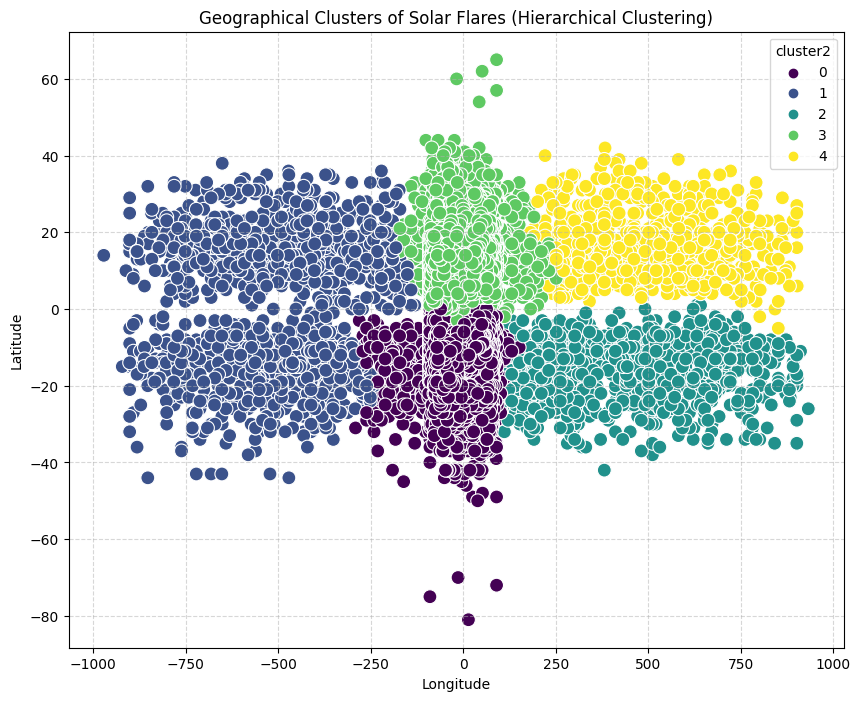

In [ ]:
import pandas as pd
import matplotlib.pyplot as plt
from sklearn.cluster import AgglomerativeClustering
from sklearn.preprocessing import StandardScaler
import seaborn as sns

# Selecting features for clustering
geographical_data = flares[['Longitude', 'Latitude']]

# Standardize the features (important for clustering)
scaler = StandardScaler()
geographical_data_scaled = scaler.fit_transform(geographical_data)

# Apply Agglomerative Clustering
n_clusters = 5  # You can adjust the number of clusters based on your analysis
agg_clustering = AgglomerativeClustering(n_clusters=n_clusters)
flares['cluster2'] = agg_clustering.fit_predict(geographical_data_scaled)

# Visualize the clusters on a scatter plot
plt.figure(figsize=(10, 8))
sns.scatterplot(x='Longitude', y='Latitude', hue='cluster2', data=flares, palette='viridis', s=100)
plt.title('Geographical Clusters of Solar Flares (Hierarchical Clustering)')
plt.xlabel('Longitude')
plt.ylabel('Latitude')

plt.grid(True, linestyle='--', alpha=0.5)

plt.show()


In [ ]:
from sklearn.metrics import silhouette_score, calinski_harabasz_score, davies_bouldin_score

# Assuming you have already run KMeans and have `geographical_data_scaled` and `flares['cluster']` from your previous code

# Silhouette Score
silhouette_avg = silhouette_score(geographical_data_scaled, flares['cluster'])
print(f'Silhouette Score: {silhouette_avg}')

# Calinski-Harabasz Index
calinski_harabasz = calinski_harabasz_score(geographical_data_scaled, flares['cluster'])
print(f'Calinski-Harabasz Index: {calinski_harabasz}')

# Davies-Bouldin Index
davies_bouldin = davies_bouldin_score(geographical_data_scaled, flares['cluster'])
print(f'Davies-Bouldin Index: {davies_bouldin}')

Silhouette Score: 0.41785722386899943
Calinski-Harabasz Index: 9882.660873462968
Davies-Bouldin Index: 0.798757818429862


In [ ]:
# Grouping the data by cluster
clustered_data = flares.groupby('cluster')

# Calculating statistical summaries for each cluster
summary_statistics = clustered_data.agg({
    'Flare Magnitude': ['mean', 'median', 'std', 'min', 'max'],
    'Latitude': ['mean', 'median', 'std'],
    'Longitude': ['mean', 'median', 'std']
})

print(summary_statistics)


        Flare Magnitude                                 Latitude         \
                   mean median        std   min   max       mean median   
cluster                                                                   
0             37.556640   30.0  23.736796   0.0  99.0 -16.991527  -16.0   
1             36.172863   28.0  23.767253  10.0  99.0  10.217325   11.0   
2             39.784360   34.0  24.954561  10.0  99.0 -18.265403  -18.0   
3             38.663176   33.0  24.607122   0.0  98.0  -2.525305  -10.0   
4             39.799383   32.0  25.691909  10.0  99.0  18.725309   18.0   
5             37.244421   30.0  23.447925   0.0  99.0  24.317747   23.0   

                     Longitude                     
               std        mean median         std  
cluster                                            
0         7.406524   -2.556456   -3.0   64.376512  
1         4.886589    0.496742    0.0   58.586737  
2         7.669583  525.286730  511.0  173.688149  
3        18.

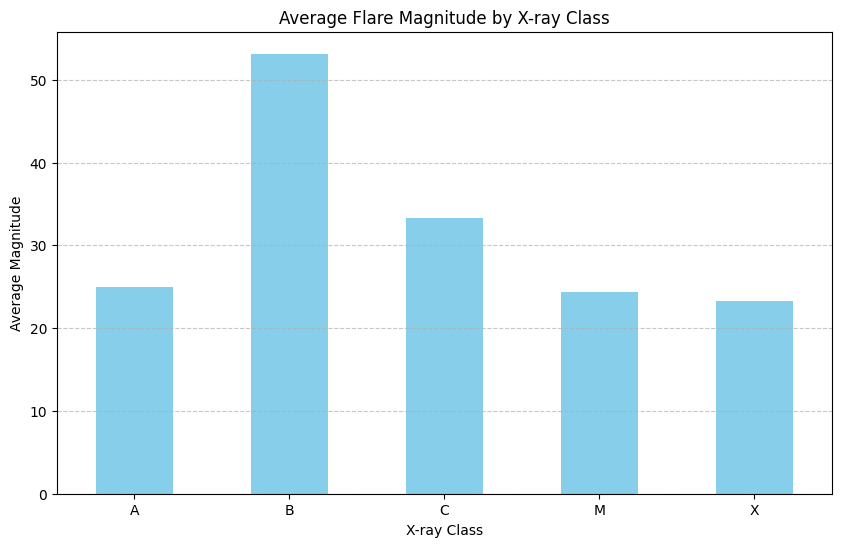

In [ ]:
import matplotlib.pyplot as plt

# Assuming 'flares' is a pandas DataFrame with your solar flare data.

# Group by X-ray class and calculate the average magnitude
average_magnitude_by_class = flares.groupby('X-ray Class')['Flare Magnitude'].mean()

# Plotting the average magnitude by X-ray class
average_magnitude_by_class.plot(kind='bar', color='skyblue', figsize=(10, 6))
plt.title('Average Flare Magnitude by X-ray Class')
plt.xlabel('X-ray Class')
plt.ylabel('Average Magnitude')
plt.xticks(rotation=0)  # Keep the X-ray class labels horizontal
plt.grid(axis='y', linestyle='--', alpha=0.7)
plt.show()


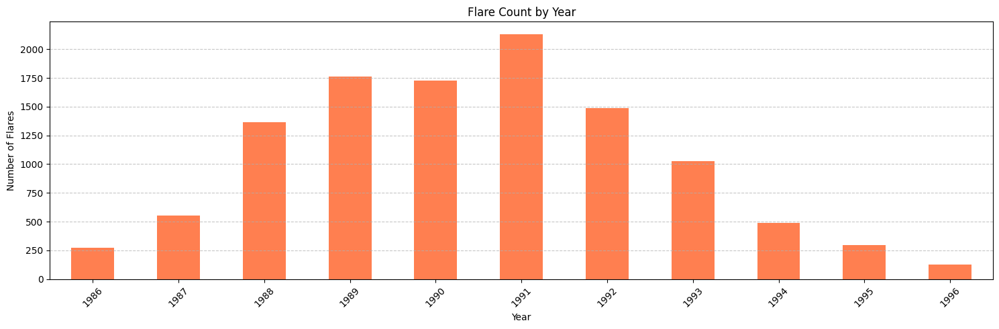

In [ ]:
# Group by Year and count the number of flares
flare_count_by_year = flares.groupby('Year').size()

# Plotting the flare count by Year
plt.figure(figsize=(15, 5))
flare_count_by_year.plot(kind='bar', color='coral')
plt.title('Flare Count by Year')
plt.xlabel('Year')
plt.ylabel('Number of Flares')
plt.xticks(rotation=45)  # Rotate the year labels for better readability
plt.grid(axis='y', linestyle='--', alpha=0.7)
plt.tight_layout()
plt.show()

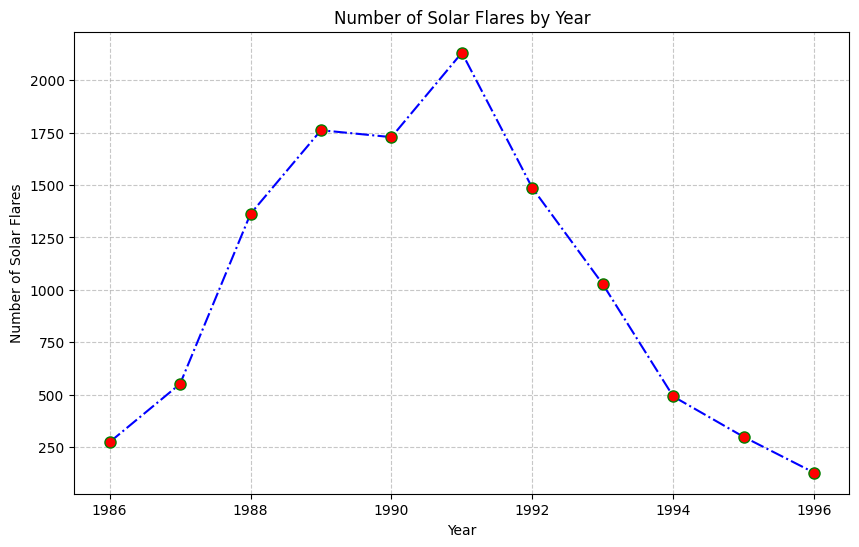

In [ ]:
import pandas as pd
import matplotlib.pyplot as plt

# Assuming 'flares' is your DataFrame containing the solar flare data
# You would need to ensure that 'Date' and 'X-ray Class' columns exist in your DataFrame

# Convert the 'Date' column to datetime
flares['Date'] = pd.to_datetime(flares['Date'])

# Set the 'Date' column as the index
flares.set_index('Date', inplace=True)

# Group the data by year, assuming your DataFrame is indexed by datetime
# The 'X-ray Class' column is used to count the number of events per year
yearly_counts = flares.resample('A').size()

# Plotting a line chart with markers for the yearly flare count
plt.figure(figsize=(10, 6))
plt.plot(
    yearly_counts.index.year,  # X-axis values: years
    yearly_counts.values,      # Y-axis values: counts
    marker='o',                # Marker shape
    markerfacecolor='r',       # Marker fill color
    markeredgecolor='g',       # Marker edge color
    color='blue',              # Line color
    linestyle='-.',            # Line style
    markersize=8)              # Marker size

# Customize the layout
plt.title('Number of Solar Flares by Year')
plt.xlabel('Year')
plt.ylabel('Number of Solar Flares')
plt.grid(axis='both', linestyle='--', alpha=0.7)

# Save the plot to a file
plt.savefig('flare_count_by_year.png')

# Show the plot
plt.show()


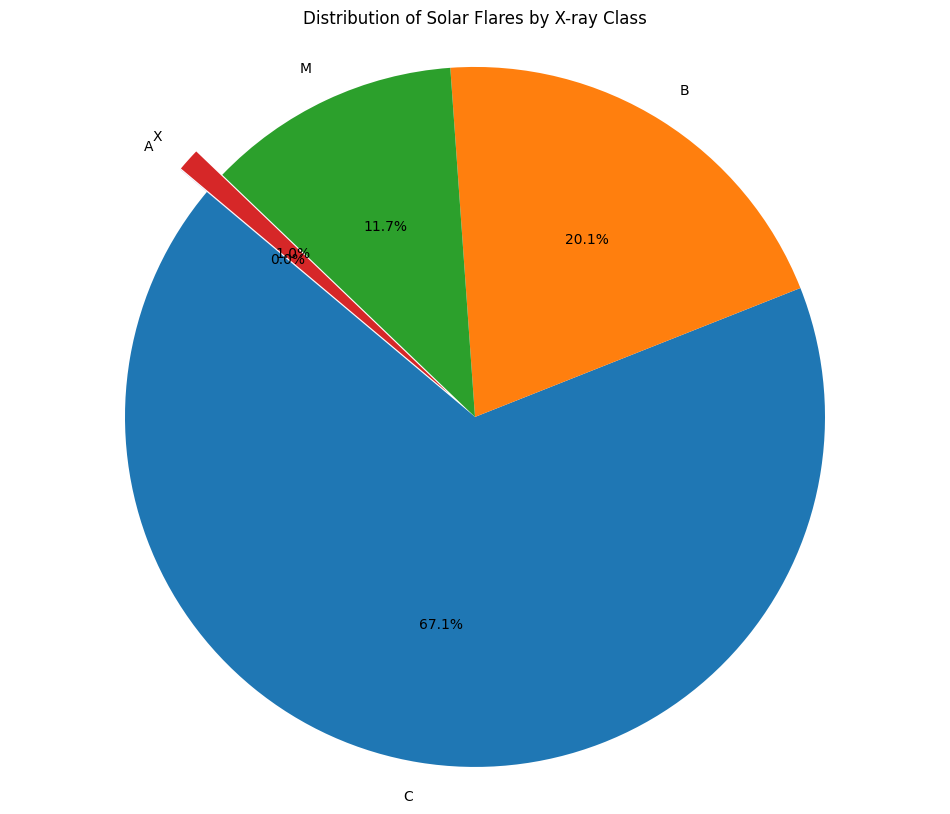

In [ ]:
import pandas as pd
import matplotlib.pyplot as plt

# Count the frequency of each X-ray class
xray_class_distribution = flares['X-ray Class'].value_counts()

# Explode the A and X slices a bit out (assuming 'A' is at index 1 and 'X' is at index 2)
explode_values = [0.1 if (cls == 'A' or cls == 'X') else 0 for cls in xray_class_distribution.index]

# Make the figure larger
plt.figure(figsize=(12, 10))

# Create the pie chart with the explode values and percentage labels
plt.pie(
    xray_class_distribution,
    labels=xray_class_distribution.index,
    autopct='%1.1f%%',  # Automatically add percentage labels with one decimal
    startangle=140,
    explode=explode_values  # Use the explode values here
)

plt.title('Distribution of Solar Flares by X-ray Class')
plt.axis('equal')  # Equal aspect ratio ensures that pie is drawn as a circle.
plt.show()

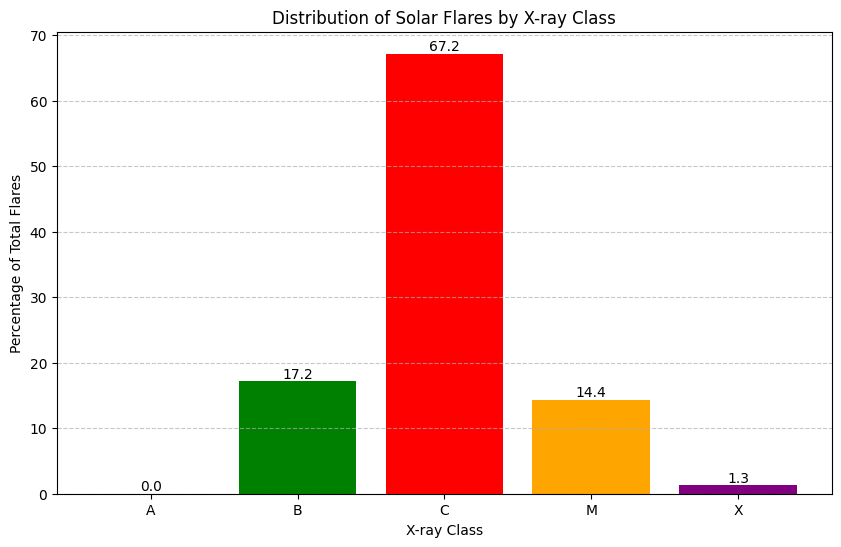

In [ ]:
import matplotlib.pyplot as plt

# Assuming 'flares' DataFrame contains the 'X-ray Class' column
# Count the frequency of each X-ray class
xray_class_distribution = flares['X-ray Class'].value_counts().sort_index()

# Calculate the percentage of each X-ray class
xray_class_percentage = (xray_class_distribution / xray_class_distribution.sum()) * 100

# Create a bar chart
plt.figure(figsize=(10, 6))
bars = plt.bar(xray_class_distribution.index, xray_class_percentage, color=['blue', 'green', 'red', 'orange', 'purple'])

# Add the percentages on top of each bar
for bar in bars:
    yval = bar.get_height()
    plt.text(bar.get_x() + bar.get_width()/2, yval, round(yval, 1), ha='center', va='bottom')

# Set the title and labels
plt.title('Distribution of Solar Flares by X-ray Class')
plt.xlabel('X-ray Class')
plt.ylabel('Percentage of Total Flares')

# Add a grid to the y-axis for better readability
plt.grid(axis='y', linestyle='--', alpha=0.7)

plt.show()

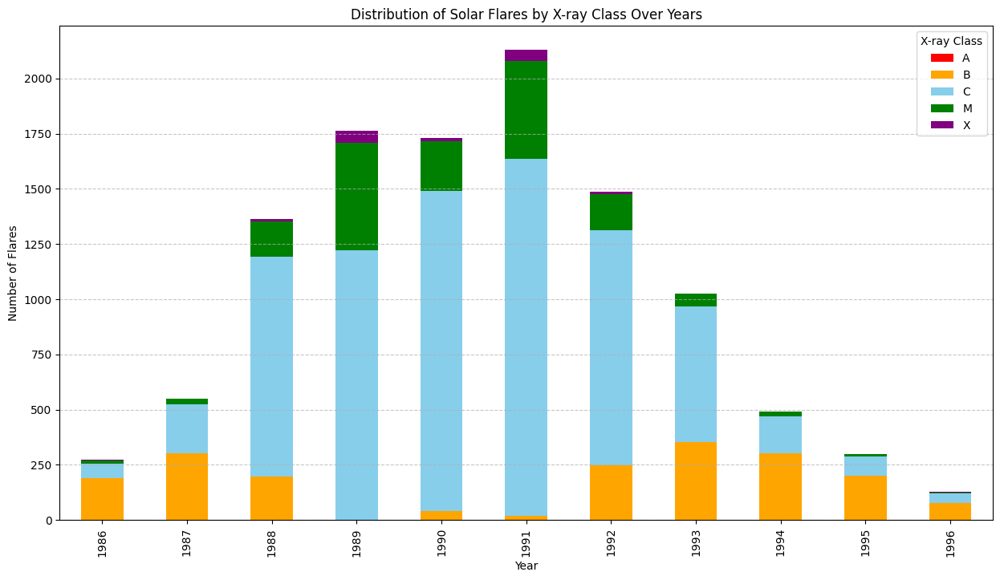

In [ ]:
import pandas as pd
import matplotlib.pyplot as plt

# Assuming 'flares' is a pandas DataFrame with your solar flare data.
# The DataFrame must have 'Year', 'X-ray Class', and 'Date' columns properly formatted.

# Extract the year from the 'Date' and group by it
flares['Year'] = flares['Date'].dt.year
flares_by_year = flares.groupby('Year')['X-ray Class'].value_counts().unstack(fill_value=0)

# Define a custom color palette for the X-ray classes
custom_colors = {
    'A': 'red',
    'B': 'orange',
    'C': 'skyblue',
    'M': 'green',
    'X': 'purple'
}

# Ensure that the colors are in the order of the X-ray classes
ordered_colors = [custom_colors[x] for x in flares_by_year.columns]

# Plotting the distribution of solar flares by X-ray class for each year with custom colors
flares_by_year.plot(kind='bar', figsize=(15, 8), stacked=True, color=ordered_colors)
plt.title('Distribution of Solar Flares by X-ray Class Over Years')
plt.xlabel('Year')
plt.ylabel('Number of Flares')
plt.grid(axis='y', linestyle='--', alpha=0.7)  # Adding grid lines for y-axis
plt.legend(title='X-ray Class')
plt.show()

## Extracting less significant flares (A, B, and C)

In [ ]:
less_significant_flares = flares[(flares['X-ray Class'] == 'A') | (flares['X-ray Class'] == 'B') | (flares['X-ray Class'] == 'C')]
less_significant_flares.head()

,Date,Start Time,End Time,Time,X-ray Class,Flare Magnititude,NOAA,Flare Duration,Year
7251,1986-01-13,1986-01-13 10:19:00,1986-01-13 10:39:00,10:29,B,18.0,4710.0,20.0,1986
7252,1986-01-13,1986-01-13 11:05:00,1986-01-13 11:25:00,11:15,B,14.0,4710.0,20.0,1986
7253,1986-01-13,1986-01-13 11:19:00,1986-01-13 11:39:00,11:29,B,18.0,4710.0,20.0,1986
7254,1986-01-13,1986-01-13 12:51:00,1986-01-13 13:11:00,13:01,B,27.0,4710.0,20.0,1986
7255,1986-01-13,1986-01-13 15:34:00,1986-01-13 15:54:00,15:44,B,15.0,4710.0,20.0,1986


## Occurrence of most frequent flares of class C, M, X

In [ ]:
spotcmx_flares = flares[(flares['X-ray Class'] == 'C') | (flares['X-ray Class'] == 'M') | (flares['X-ray Class'] == 'X')]
cmx_flares_to_visualize = cmx_flares.sort_values(by=['Date'], ascending=True)
ftv = cmx_flares_to_visualize.groupby(['Date', 'X-ray Class']).size().reset_index(name="Occurrence")
ftv.head(1000)

,Date,X-ray Class,Occurrence
0,1986-01-14,C,1
1,1986-01-15,C,2
2,1986-01-15,M,1
3,1986-01-16,C,1
4,1986-01-16,M,2
...,...,...,...
995,1989-09-12,M,3
996,1989-09-13,C,1
997,1989-09-13,M,2
998,1989-09-14,C,1


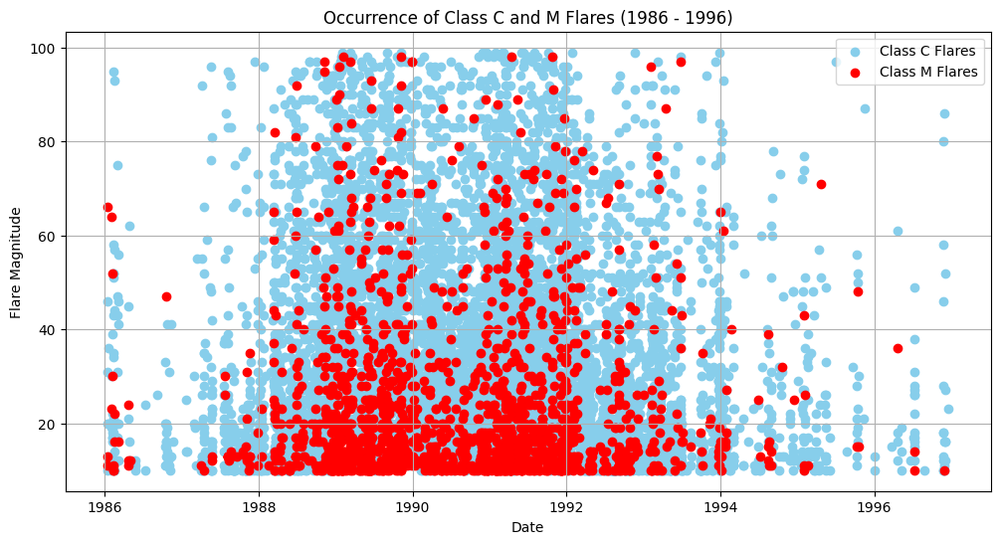

In [ ]:
import matplotlib.pyplot as plt
import pandas as pd
# Filter the dataset for Class C and M flares between 1996 and 2008
class_c_m_flares = flares[
    ((flares['X-ray Class'] == 'C') | (flares['X-ray Class'] == 'M')) &
    (flares['Date'].dt.year >= 1986) & (flares['Date'].dt.year <= 1996)
]

# Create separate DataFrames for Class C and M flares
class_c_flares = class_c_m_flares[class_c_m_flares['X-ray Class'] == 'C']
class_m_flares = class_c_m_flares[class_c_m_flares['X-ray Class'] == 'M']

# Create a scatter plot
plt.figure(figsize=(12, 6))
plt.scatter(class_c_flares['Date'], class_c_flares['Flare Magnititude'], label='Class C Flares', color='skyblue')
plt.scatter(class_m_flares['Date'], class_m_flares['Flare Magnititude'], label='Class M Flares', color='red')

# Label the axes
plt.xlabel('Date')
plt.ylabel('Flare Magnitude')

# Add a legend
plt.legend()

# Title the plot with the correct years
plt.title('Occurrence of Class C and M Flares (1986 - 1996)')
plt.grid(True)

# Show the plot
plt.show()

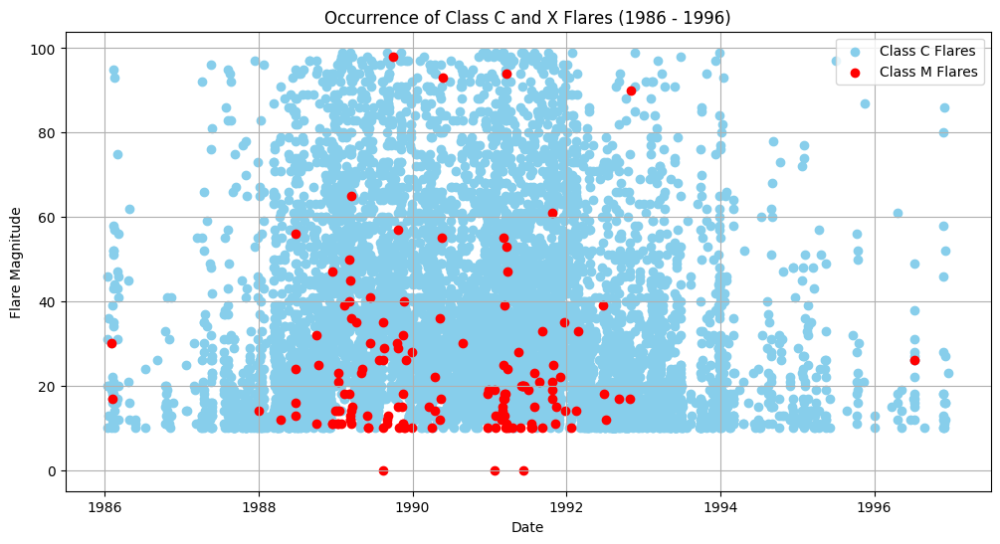

In [ ]:
import matplotlib.pyplot as plt
import pandas as pd
# Filter the dataset for Class C and M flares between 1996 and 2008
class_c_m_flares = flares[
    ((flares['X-ray Class'] == 'C') | (flares['X-ray Class'] == 'X')) &
    (flares['Date'].dt.year >= 1986) & (flares['Date'].dt.year <= 1996)
]

# Create separate DataFrames for Class C and M flares
class_c_flares = class_c_m_flares[class_c_m_flares['X-ray Class'] == 'C']
class_m_flares = class_c_m_flares[class_c_m_flares['X-ray Class'] == 'X']

# Create a scatter plot
plt.figure(figsize=(12, 6))
plt.scatter(class_c_flares['Date'], class_c_flares['Flare Magnititude'], label='Class C Flares', color='skyblue')
plt.scatter(class_m_flares['Date'], class_m_flares['Flare Magnititude'], label='Class M Flares', color='red')

# Label the axes
plt.xlabel('Date')
plt.ylabel('Flare Magnitude')

# Add a legend
plt.legend()

# Title the plot with the correct years
plt.title('Occurrence of Class C and X Flares (1986 - 1996)')
plt.grid(True)

# Show the plot
plt.show()

In [ ]:
# Relationship between flare classes
relationship_df = pd.pivot_table(flares, index='Date', columns='X-ray Class', aggfunc='size', fill_value=0)
relationship_df.head()

X-ray Class,A,B,C,M,X
Date,,,,,
1986-01-13,0,5,0,0,0
1986-01-14,0,2,1,0,0
1986-01-15,0,2,2,1,0
1986-01-16,0,0,0,2,0
1986-01-31,0,1,0,0,0


In [ ]:
# Correlation matrix to plot heatmap
corr = relationship_df.corr()
corr

X-ray Class,A,B,C,M,X
X-ray Class,,,,,
A,1.000000,-0.011973,-0.020459,-0.010195,-0.004379
B,-0.011973,1.000000,-0.320086,-0.256037,-0.128274
C,-0.020459,-0.320086,1.000000,0.261757,0.056168
M,-0.010195,-0.256037,0.261757,1.000000,0.251097
X,-0.004379,-0.128274,0.056168,0.251097,1.000000


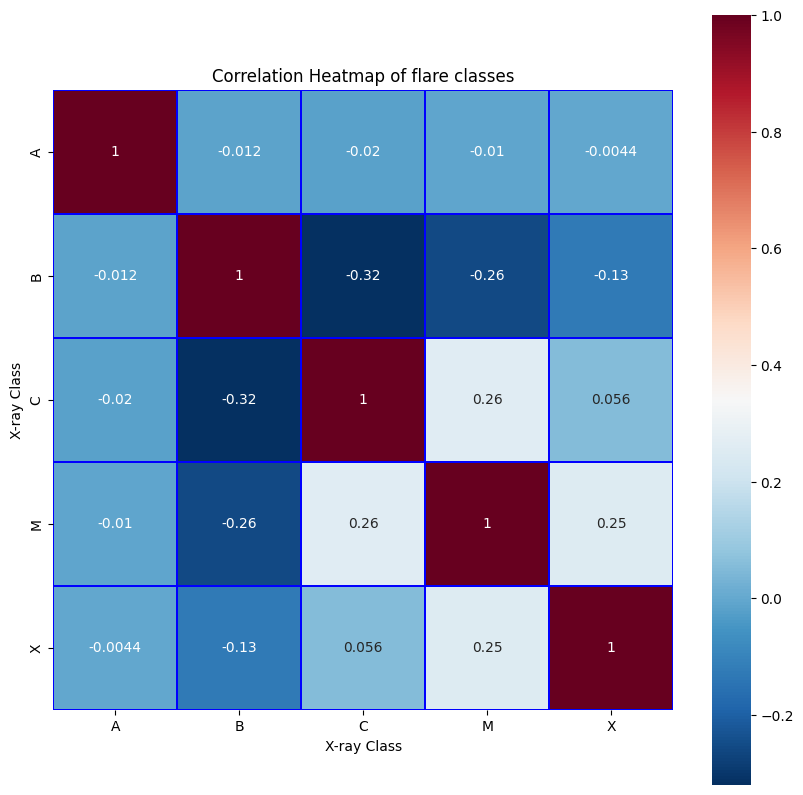

In [ ]:
#heat map plot
plt.gcf().set_size_inches((10,10))
colormap = plt.cm.RdBu_r
sns.heatmap(corr,
        xticklabels=corr.columns,
        yticklabels=corr.columns,
            square=True, linewidths=0.15, cmap=colormap, linecolor='blue', annot=True)
plt.title('Correlation Heatmap of flare classes')
plt.show()

# Visualizing the occurrence of bar chart of different classes of flares for each year in solar cycle 23

In [ ]:
flares_yearly_occurrence = pd.pivot_table(flares, index='Year', columns='X-ray Class', aggfunc='size', fill_value=0)
flares_yearly_occurrence['Year'] = flares_yearly_occurrence.index
flares_yearly_occurrence.head()

X-ray Class,A,B,C,M,X,Year
Year,,,,,,
1986,0,191,66,14,2,1986
1987,0,304,219,28,0,1987
1988,0,196,997,158,12,1988
1989,0,0,1222,486,54,1989
1990,0,39,1450,227,13,1990


# plotting grouped bar chart of flare classes in solar cycle 22

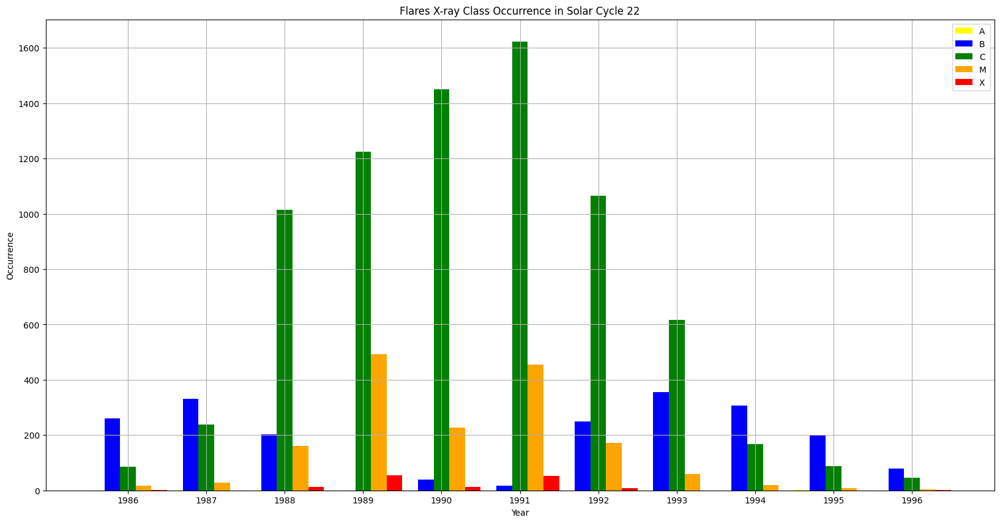

In [ ]:
import matplotlib.pyplot as plt
import numpy as np

plt.figure(figsize=(20, 10))
width = 0.2
x = np.arange(11)  # Adjust the number of years as needed

plt.bar(x - 0.4, flares_yearly_occurrence['A'], width, color='yellow')
plt.bar(x - 0.2, flares_yearly_occurrence['B'], width, color='blue')
plt.bar(x, flares_yearly_occurrence['C'], width, color='green')
plt.bar(x + 0.2, flares_yearly_occurrence['M'], width, color='orange')
plt.bar(x + 0.4, flares_yearly_occurrence['X'], width, color='red')

# Adjust the labels and legend as needed
plt.xticks(x, flares_yearly_occurrence['Year'])
plt.xlabel('Year')
plt.ylabel('Occurrence')
plt.legend(['A', 'B', 'C', 'M', 'X'])
plt.title('Flares X-ray Class Occurrence in Solar Cycle 22')
plt.grid(True)
plt.show()


## Visualizing number of daily sunspots and number of solar flares in solar cycle 23

In [ ]:
# flare occurrence
flares_occurrence = flares.groupby(['Date']).size().reset_index(name="Occurrence")
flares_occurrence.head()

,Date,Occurrence
0,1986-01-13,11
1,1986-01-14,3
2,1986-01-15,6
3,1986-01-16,3
4,1986-01-17,3


In [ ]:
# spots occurrence
spots_occurrence = spots.groupby(['Date']).sum('Number of Spots').reset_index()
spots_occurrence.drop(axis=1, labels=['Year'], inplace=True)
spots_occurrence.head()n

,Date,Number of Spots
0,1986-01-13,40
1,1986-01-14,73
2,1986-01-15,52
3,1986-01-16,7
4,1986-01-30,4


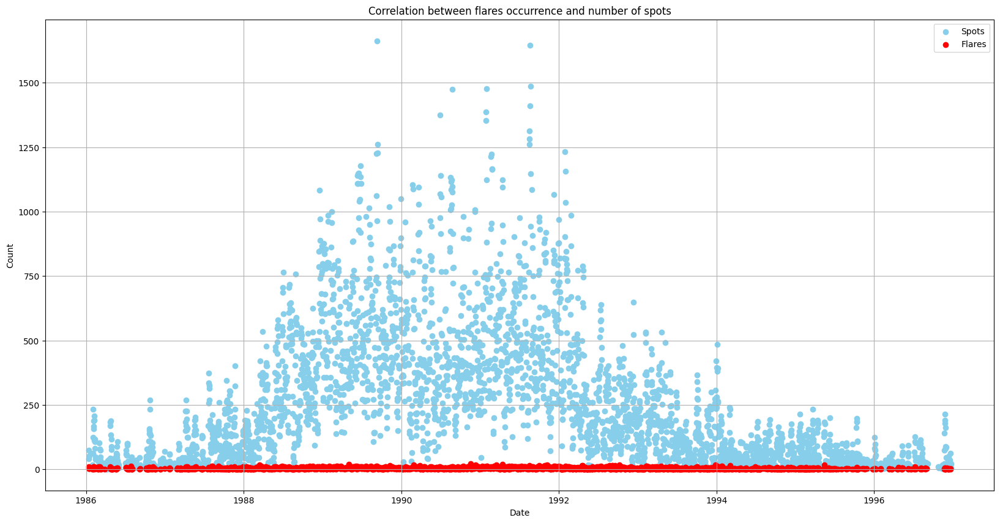

In [ ]:
import matplotlib.pyplot as plt



# Create a scatter plot with colors based on the 'Occurrence' column
plt.figure(figsize=(20, 10))
plt.scatter(spots_occurrence['Date'], spots_occurrence['Number of Spots'], c='skyblue', label='Spots')
plt.scatter(flares_occurrence['Date'], flares_occurrence['Occurrence'], c='red', label='Flares')

# Label the axes
plt.xlabel('Date')
plt.ylabel('Count')

# Add a title
plt.title('Correlation between flares occurrence and number of spots')

# Add a legend
plt.legend()

# Show the plot
plt.grid(True)
plt.show()

In [ ]:
import pandas as pd
import plotly.express as px

# Assuming 'spots' and 'significant_flares' DataFrames are already defined.

# Convert the 'NOAA' column in both dataframes to int64 for consistency
spots['NOAA'] = pd.to_numeric(spots['NOAA'], errors='coerce').fillna(0).astype(int)
significant_flares['NOAA'] = pd.to_numeric(significant_flares['NOAA'], errors='coerce').fillna(0).astype(int)

# Merge the two dataframes on the 'NOAA' column to find sunspots associated with significant flares
merged_data = spots.merge(significant_flares, on='NOAA', how='inner', suffixes=('_spots', '_flares'))

# Let's visualize the merged data
# We'll plot 'Sunspot Count' from spots vs 'Flare Importance' from significant_flares
fig = px.scatter(
    merged_data,
    x='Date_spots',
    y='Number of Spots',
    color='Flare Duration',
    title="Sunspot Count vs Flare Importance Over Time",
    labels={'Date_spots': 'Date', 'Sunspot Count': 'Sunspot Count', 'Flare Importance': 'Flare Duration'}
)

fig.show()


<ipython-input-61-18117b0238a1>:8: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy



## Visually identifying sunspots that produced significant flares

In [ ]:
# Convert the 'NOAA' column in spots to int64
spots['NOAA'] = spots['NOAA'].astype(int)

# Filter sunspots with significant flares
sunspot_with_significant_flares = spots.loc[spots['NOAA'].isin(significant_flares['NOAA'])]
sunspot_with_significant_flares.head()

,Date,Time,Number of Spots,McIntosh Class,NOAA,Zurich Class,Penumbra Class,Compactness Class,DateTime,Year
37111,1986-01-13,2:25,1,AXX,4710,A,X,X,1986-01-13 02:25:00,1986
37112,1986-01-13,7:40,4,CRO,4710,C,R,O,1986-01-13 07:40:00,1986
37113,1986-01-13,13:35,12,DAO,4710,D,A,O,1986-01-13 13:35:00,1986
37114,1986-01-13,15:25,3,DSO,4710,D,S,O,1986-01-13 15:25:00,1986
37116,1986-01-13,17:07,12,DSO,4710,D,S,O,1986-01-13 17:07:00,1986


In [ ]:
# Zurich class occurrence
zurich_class_occurrence = sunspot_with_significant_flares.groupby(['Zurich Class']).size().reset_index(name="Occurrence")
zurich_class_occurrence.head()

,Zurich Class,Occurrence
0,A,19
1,B,1722
2,C,4875
3,D,7467
4,E,6842


In [ ]:
# Penumbra class occurrence
penumbra_class_occurrence = sunspot_with_significant_flares.groupby(['Penumbra Class']).size().reset_index(name="Occurrence")
penumbra_class_occurrence.head()

,Penumbra Class,Occurrence
0,A,8950
1,H,985
2,K,8856
3,R,592
4,S,3576


In [ ]:
# Compactness class occurrence
compactness_class_occurrence = sunspot_with_significant_flares.groupby(['Compactness Class']).size().reset_index(name="Occurrence")
compactness_class_occurrence.head()

,Compactness Class,Occurrence
0,C,1812
1,I,8194
2,O,14665
3,X,25


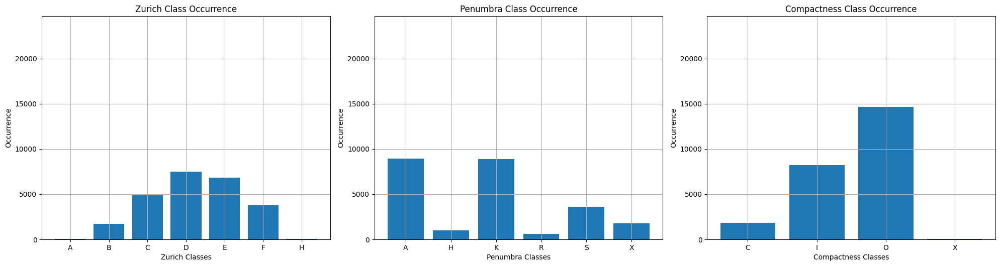

In [ ]:
plt.gcf().set_size_inches((20, 10))

# Subplot 1
plt.subplot(2, 3, 1)
plt.bar(zurich_class_occurrence['Zurich Class'], zurich_class_occurrence['Occurrence'])
plt.xlabel('Zurich Classes')
plt.ylabel('Occurrence')
plt.title('Zurich Class Occurrence')
plt.ylim(0, len(sunspot_with_significant_flares))
plt.grid(True)  # Add grid lines

# Subplot 2
plt.subplot(2, 3, 2)
plt.bar(penumbra_class_occurrence['Penumbra Class'], penumbra_class_occurrence['Occurrence'])
plt.xlabel('Penumbra Classes')
plt.ylabel('Occurrence')
plt.title('Penumbra Class Occurrence')
plt.ylim(0, len(sunspot_with_significant_flares))
plt.grid(True)  # Add grid lines

# Subplot 3
plt.subplot(2, 3, 3)
plt.bar(compactness_class_occurrence['Compactness Class'], compactness_class_occurrence['Occurrence'])
plt.xlabel('Compactness Classes')
plt.ylabel('Occurrence')
plt.title('Compactness Class Occurrence')
plt.ylim(0, len(sunspot_with_significant_flares))
plt.grid(True)  # Add grid lines

plt.tight_layout()  # Adjust subplot spacing
plt.show()


In [ ]:
# Cross tab relationship between zurich class, penumbra class and compactness class of sunspot with significant flares
ct = pd.crosstab(sunspot_with_significant_flares['Zurich Class'], [sunspot_with_significant_flares['Penumbra Class'], sunspot_with_significant_flares['Compactness Class']])
ct.head()

Penumbra Class      A                  H                 K                 R  \
Compactness Class   C     I     O  X   C    I    O  X    C     I    O  X   I   
Zurich Class                                                                   
A                   0     0     0  0   0    0    0  0    0     0    0  0   0   
B                   0     0     1  0   0    0    0  0    0     0    0  0   0   
C                   3   169  1755  0   0   23  233  0   10   105  627  0  32   
D                  65  1151  2497  0   6   81  125  0  371   890  828  0  39   
E                  49  1159  1282  0  10  185  145  0  625  1815  973  0   2   

Penumbra Class          S              X            
Compactness Class    O  C    I     O   I     O   X  
Zurich Class                                        
A                    0  0    0     0   0     5  14  
B                    3  0    0     5  44  1669   0  
C                  391  0   75  1451   1     0   0  
D                  112  4  259  1037   0     2   0  
E                    9  0  196   391   1     0   0

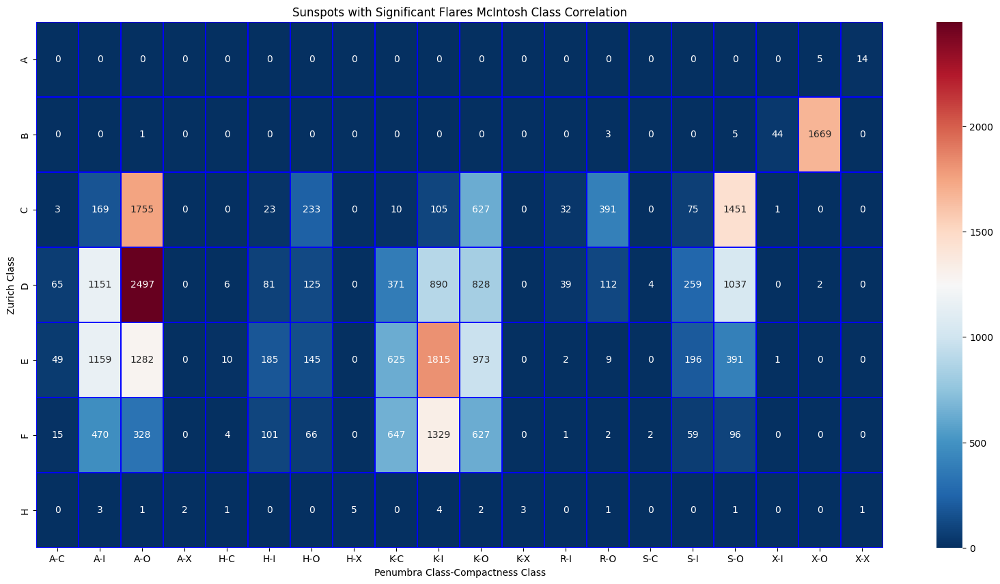

In [ ]:
plt.gcf().set_size_inches((20,10))
sns.heatmap(ct, annot=True, fmt='d', linewidths=0.15, cmap=colormap, linecolor='blue')
plt.title('Sunspots with Significant Flares McIntosh Class Correlation')
plt.show()

## Visually identifying sunspots that produced less significant flares

In [ ]:
# Sunspots with les significant flares
# Convert the 'NOAA' column in spots to int64
spots['NOAA'] = spots['NOAA'].astype(int)

sunspot_with_less_significant_flares = spots.loc[spots['NOAA'].isin(less_significant_flares['NOAA'])]
sunspot_with_less_significant_flares.head()

,Date,Time,Number of Spots,McIntosh Class,NOAA,Zurich Class,Penumbra Class,Compactness Class,DateTime,Year


In [ ]:
# Zurich class occurrence
zurich_class_occurrence = sunspot_with_less_significant_flares.groupby(['Zurich Class']).size().reset_index(name="Occurrence")
zurich_class_occurrence.head()

,Zurich Class,Occurrence


In [ ]:
# Penumbra class occurrence
penumbra_class_occurrence = sunspot_with_less_significant_flares.groupby(['Penumbra Class']).size().reset_index(name="Occurrence")
penumbra_class_occurrence.head()

,Penumbra Class,Occurrence
0,A,8934
1,H,558
2,K,3484
3,R,938
4,S,7786


In [ ]:
# Compactness class occurrence
compactness_class_occurrence = sunspot_with_less_significant_flares.groupby(['Compactness Class']).size().reset_index(name="Occurrence")
compactness_class_occurrence.head()

,Compactness Class,Occurrence
0,C,1388
1,I,3829
2,O,16079
3,X,2983


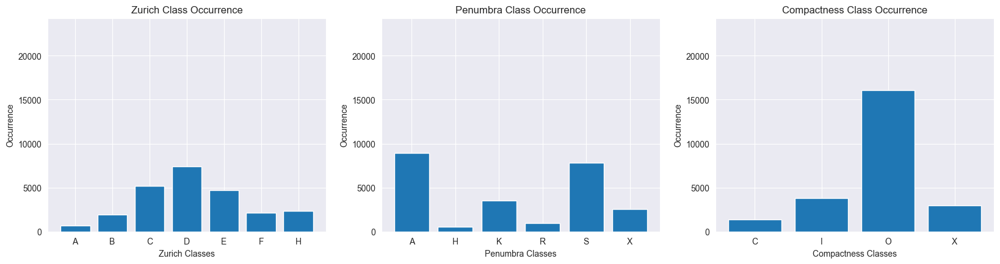

In [ ]:
# Bar plots of occurrences of zurich class, penumbra class and compactness class

plt.gcf().set_size_inches((20,10))
plt.subplot(2, 3, 1)
plt.bar(zurich_class_occurrence['Zurich Class'], zurich_class_occurrence['Occurrence'])
plt.xlabel('Zurich Classes')
plt.ylabel('Occurrence')
plt.title('Zurich Class Occurrence')
plt.ylim(0,len(sunspot_with_less_significant_flares))

plt.subplot(2, 3, 2)
plt.bar(penumbra_class_occurrence['Penumbra Class'], penumbra_class_occurrence['Occurrence'])
plt.xlabel('Penumbra Classes')
plt.ylabel('Occurrence')
plt.title('Penumbra Class Occurrence')
plt.ylim(0,len(sunspot_with_less_significant_flares))

plt.subplot(2, 3, 3)
plt.bar(compactness_class_occurrence['Compactness Class'], compactness_class_occurrence['Occurrence'])
plt.xlabel('Compactness Classes')
plt.ylabel('Occurrence')
plt.title('Compactness Class Occurrence')
plt.ylim(0,len(sunspot_with_less_significant_flares))

plt.show()

In [ ]:
ct = pd.crosstab(sunspot_with_less_significant_flares['Zurich Class'], [sunspot_with_less_significant_flares['Penumbra Class'], sunspot_with_less_significant_flares['Compactness Class']])
ct.head()

Penumbra Class       A                 H                K       ...   R       \
Compactness Class    C    I     O  X   C   I    O  X    C    I  ...   I    O   
Zurich Class                                                    ...            
A                    0    0     0  2   0   0    0  0    0    0  ...   0    0   
B                    0    0     1  0   0   0    1  0    0    0  ...   0    3   
C                    4   31  1494  2   0   8  131  0    0   12  ...   5  602   
D                  100  710  3067  1   8  19   78  0  116  287  ...  10  156   
E                  172  851  1169  1  17  49   91  0  364  603  ...   3   17   

Penumbra Class         S                X             
Compactness Class  X   C    I     O  X  I     O    X  
Zurich Class                                          
A                  0   0    0     0  0  0     4  660  
B                  0   0    0     5  0  9  1891    8  
C                  6   1   24  2599  1  0     4    0  
D                  0  33  172  2285  1  0     1    0  
E                  0  38  194   700  1  0     0    0  

[5 rows x 22 columns]

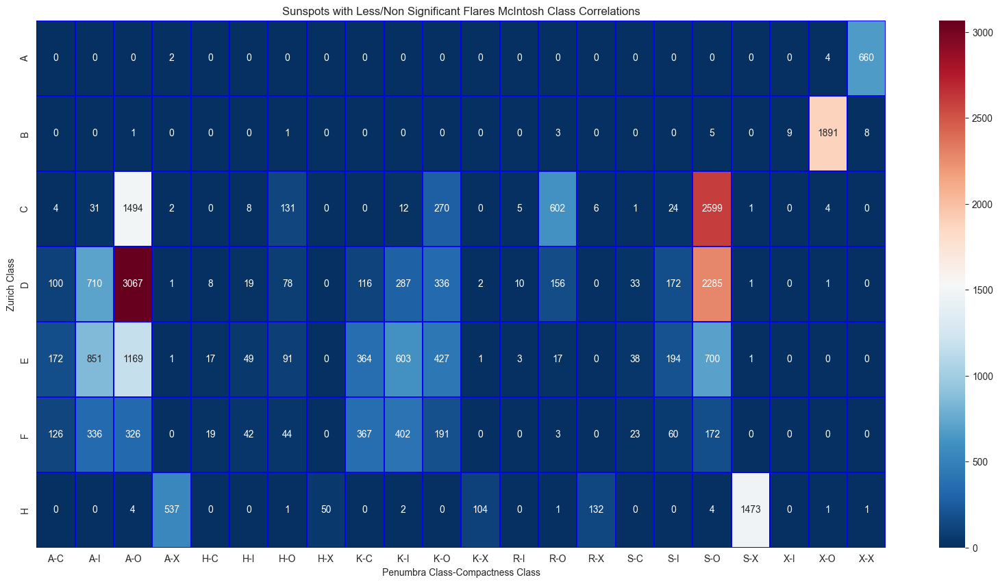

In [ ]:
plt.gcf().set_size_inches((20,10))
sns.heatmap(ct, annot=True, fmt='d', linewidths=0.15, cmap=colormap, linecolor='blue')
plt.title('Sunspots with Less/Non Significant Flares McIntosh Class Correlations')
plt.show()

Please note that these visualizations will only give an idea of the relationship of the variables but to check for correlation between non numerical variable, chi-squared test for independence is a better approach as it give a statistical results.

## Visualizing sunspots with no flares.

In [ ]:
sunspot_with_no_flares = spots.loc[~spots['NOAA'].isin(flares['NOAA'])]
sunspot_with_no_flares.head()

,Date,Time,Number of Spots,McIntosh Class,NOAA,Zurich Class,Penumbra Class,Compactness Class,DateTime,Year
37111,1986-01-13,2:25,1,AXX,4710,A,X,X,1986-01-13 02:25:00,1986
37112,1986-01-13,7:40,4,CRO,4710,C,R,O,1986-01-13 07:40:00,1986
37113,1986-01-13,13:35,12,DAO,4710,D,A,O,1986-01-13 13:35:00,1986
37114,1986-01-13,15:25,3,DSO,4710,D,S,O,1986-01-13 15:25:00,1986
37116,1986-01-13,17:07,12,DSO,4710,D,S,O,1986-01-13 17:07:00,1986


In [ ]:
zurich_class_occurrence = sunspot_with_no_flares.groupby(['Zurich Class']).size().reset_index(name="Occurrence")
penumbra_class_occurrence = sunspot_with_no_flares.groupby(['Penumbra Class']).size().reset_index(name="Occurrence")
compactness_class_occurrence = sunspot_with_no_flares.groupby(['Compactness Class']).size().reset_index(name="Occurrence")

<ipython-input-413-6c44070a9dd5>:10: UserWarning: Attempting to set identical low and high ylims makes transformation singular; automatically expanding.
  plt.ylim(0, len(sunspot_with_less_significant_flares))
<ipython-input-413-6c44070a9dd5>:18: UserWarning: Attempting to set identical low and high ylims makes transformation singular; automatically expanding.
  plt.ylim(0, len(sunspot_with_less_significant_flares))
<ipython-input-413-6c44070a9dd5>:26: UserWarning: Attempting to set identical low and high ylims makes transformation singular; automatically expanding.
  plt.ylim(0, len(sunspot_with_less_significant_flares))


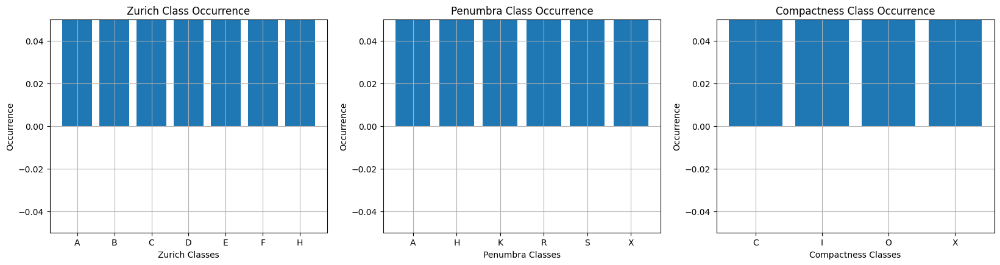

In [ ]:
# Bar plots of occurrences of zurich class, penumbra class, and compactness class

plt.gcf().set_size_inches((20,10))

plt.subplot(2, 3, 1)
plt.bar(zurich_class_occurrence['Zurich Class'], zurich_class_occurrence['Occurrence'])
plt.xlabel('Zurich Classes')
plt.ylabel('Occurrence')
plt.title('Zurich Class Occurrence')
plt.ylim(0, len(sunspot_with_less_significant_flares))
plt.grid(True)  # Add grid

plt.subplot(2, 3, 2)
plt.bar(penumbra_class_occurrence['Penumbra Class'], penumbra_class_occurrence['Occurrence'])
plt.xlabel('Penumbra Classes')
plt.ylabel('Occurrence')
plt.title('Penumbra Class Occurrence')
plt.ylim(0, len(sunspot_with_less_significant_flares))
plt.grid(True)  # Add grid

plt.subplot(2, 3, 3)
plt.bar(compactness_class_occurrence['Compactness Class'], compactness_class_occurrence['Occurrence'])
plt.xlabel('Compactness Classes')
plt.ylabel('Occurrence')
plt.title('Compactness Class Occurrence')
plt.ylim(0, len(sunspot_with_less_significant_flares))
plt.grid(True)  # Add grid

plt.show()


In [ ]:
no_flares_ct = pd.crosstab(sunspot_with_no_flares['Zurich Class'], [sunspot_with_no_flares['Penumbra Class'], sunspot_with_no_flares['Compactness Class']])
no_flares_ct.head()

Penumbra Class       A                  H                 K        ...    R  \
Compactness Class    C     I     O  X   C    I    O  X    C     I  ...    I   
Zurich Class                                                       ...        
A                    0     0     0  0   0    0    0  0    0     0  ...    0   
B                    0     1     6  0   0    0    0  0    0     0  ...    0   
C                    6   489  7900  0   0   40  700  0   11   161  ...  147   
D                  119  2507  8795  0  11  160  393  0  428  1288  ...  134   
E                   59  1733  2618  0  12  253  299  0  683  2275  ...    5   

Penumbra Class               S                  X              
Compactness Class     O  X   C    I     O  X    I      O    X  
Zurich Class                                                   
A                     1  0   0    0     0  0    1     52  119  
B                    25  0   0    0    13  0  199  15771    0  
C                  3212  0   2  281  8271  0    1     16    0  
D                   732  0  12  689  4239  0    1      3    0  
E                    33  0   5  405  1020  0    1      0    0  

[5 rows x 22 columns]

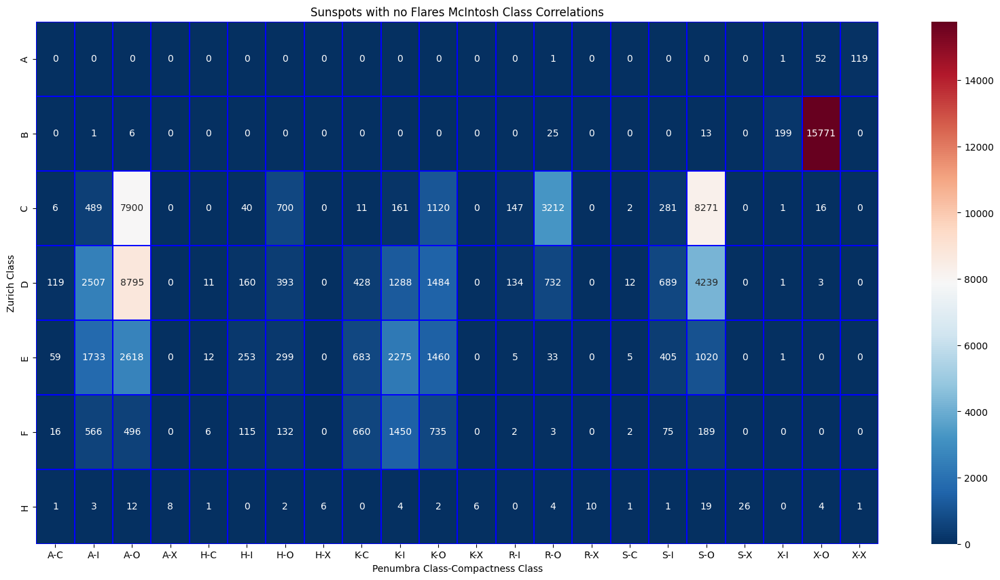

In [ ]:
plt.gcf().set_size_inches((20,10))
sns.heatmap(no_flares_ct, annot=True, fmt='d', linewidths=0.15, cmap=colormap, linecolor='blue')
plt.title('Sunspots with no Flares McIntosh Class Correlations')
plt.show()

In [ ]:
flares.columns

Int64Index([0, 1, 4, 5, 6, 8], dtype='int64')

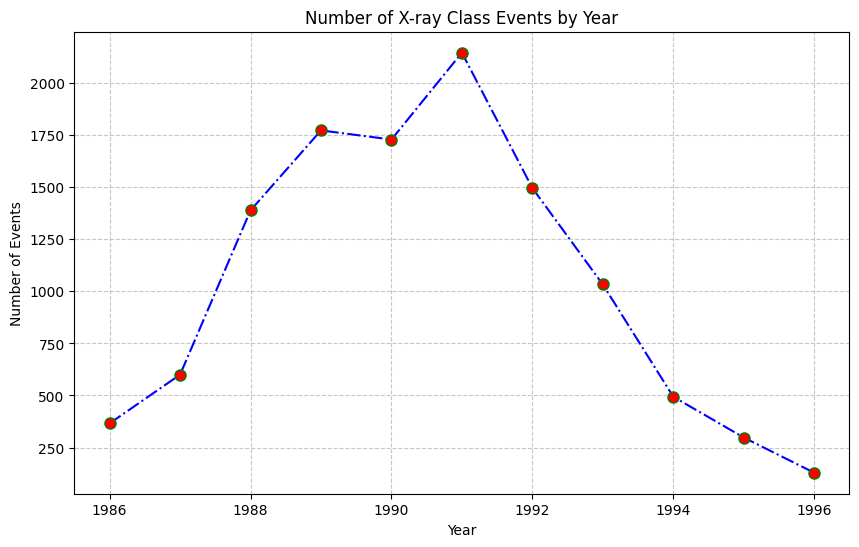

In [ ]:
import pandas as pd
import matplotlib.pyplot as plt

# Assuming 'flares' is your DataFrame containing the solar flare data
# You would need to ensure that 'Date' and 'X-ray Class' columns exist in your DataFrame

# Convert the 'Date' column to datetime
flares['Date'] = pd.to_datetime(flares['Date'])

# Set the 'Date' column as the index
flares.set_index('Date', inplace=True)

# Group the data by year if not already done, assuming your DataFrame is indexed by datetime
yearly_counts = flares.resample('A')['X-ray Class'].count()

# Plotting a line chart with markers for the 'X-ray Class' over time
plt.figure(figsize=(10, 6))
plt.plot(
    yearly_counts.index.year,  # X-axis values: years
    yearly_counts.values,      # Y-axis values: counts
    marker='o',                # Marker shape
    markerfacecolor='r',       # Marker fill color
    markeredgecolor='g',       # Marker edge color
    color='blue',              # Line color
    linestyle='-.',            # Line style
    markersize=8)              # Marker size

# Customize the layout
plt.title('Number of X-ray Class Events by Year')
plt.xlabel('Year')
plt.ylabel('Number of Events')
plt.grid(axis='both', linestyle='--', alpha=0.7)

# Save the plot to a file
plt.savefig('xray_class_by_year.png')

# Show the plot
plt.show()


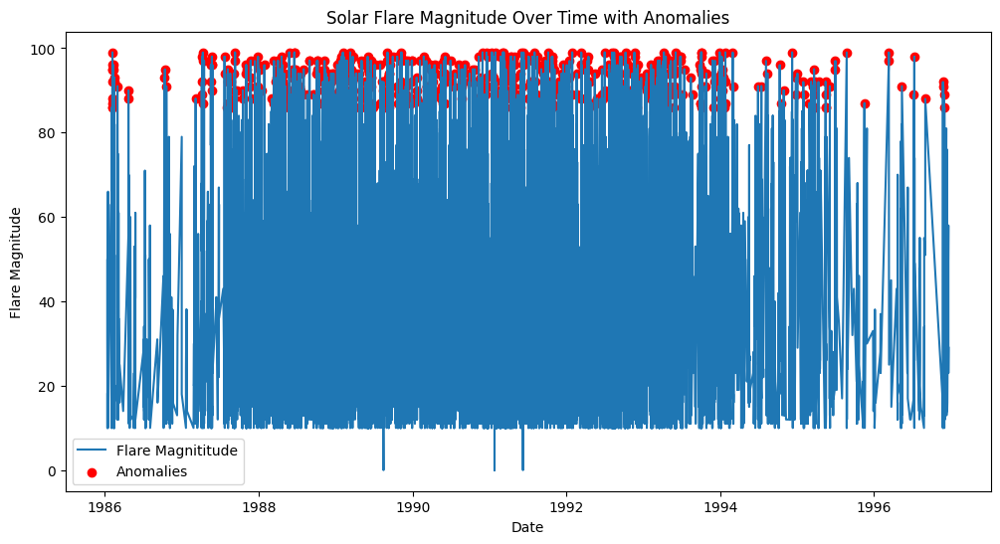

In [ ]:
import matplotlib.pyplot as plt

# Calculate descriptive statistics
mean_magnitude = flares['Flare Magnititude'].mean()
std_deviation = flares['Flare Magnititude'].std()

# Define a threshold for anomalies (e.g., 2 standard deviations from the mean)
threshold = mean_magnitude + 2 * std_deviation

# Detect anomalies
anomalies = flares[flares['Flare Magnititude'] > threshold]

# Create a time series plot of 'Flare Magnitude'
plt.figure(figsize=(12, 6))
plt.plot(flares['Date'], flares['Flare Magnititude'], label='Flare Magnititude')
plt.scatter(anomalies['Date'], anomalies['Flare Magnititude'], color='red', label='Anomalies')
plt.xlabel('Date')
plt.ylabel('Flare Magnitude')
plt.title('Solar Flare Magnitude Over Time with Anomalies')
plt.legend()
plt.show()


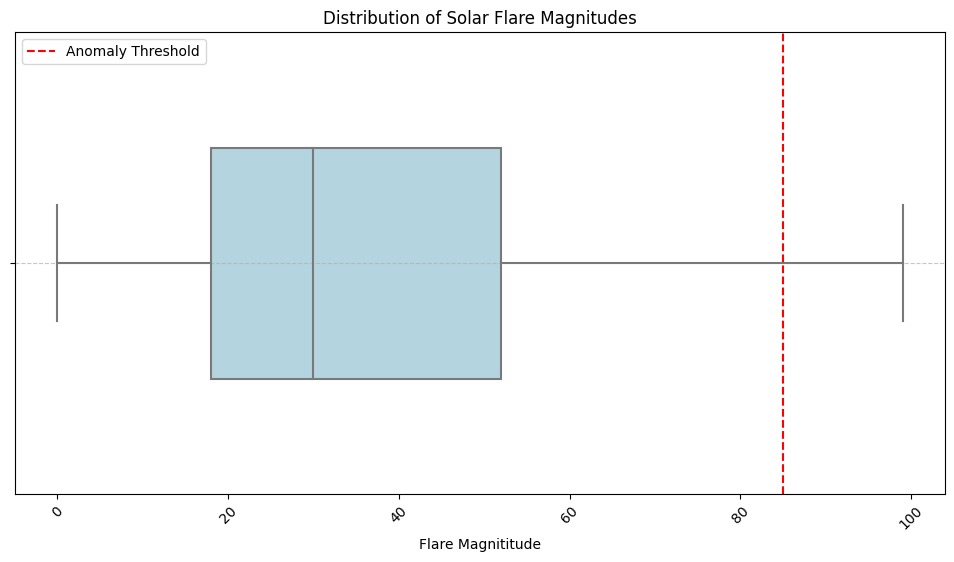

In [ ]:
import matplotlib.pyplot as plt
import seaborn as sns

# Create a box plot or violin plot of 'Flare Magnitude'
plt.figure(figsize=(12, 6))
sns.boxplot(x=flares['Flare Magnititude'], color='lightblue', width=0.5)
plt.xlabel('Flare Magnititude')
plt.title('Distribution of Solar Flare Magnitudes')
plt.xticks(rotation=45)
plt.grid(axis='y', linestyle='--', alpha=0.7)

# Identify anomalies
mean_magnitude = flares['Flare Magnititude'].mean()
std_deviation = flares['Flare Magnititude'].std()

# Define a threshold for anomalies (e.g., 2 standard deviations from the mean)
threshold = mean_magnitude + 2 * std_deviation

# Mark anomalies on the plot
plt.axvline(threshold, color='red', linestyle='--', label='Anomaly Threshold')
plt.legend()

plt.show()


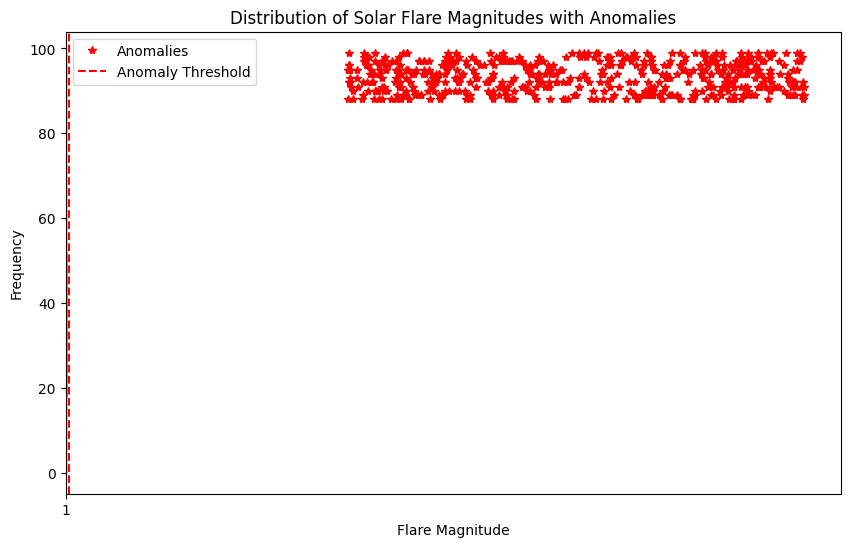

In [ ]:
import pandas as pd
import matplotlib.pyplot as plt

# Assuming 'data' is your DataFrame and it contains a column 'FlareMagnitude' with the magnitudes of solar flares
# data = pd.read_csv('path_to_your_data.csv') # Uncomment this line and replace with your actual data path

# Calculate the anomaly threshold (this will depend on your specific criteria)
# For this example, let's consider values above the 95th percentile as anomalies
anomaly_threshold = flares['Flare Magnititude'].quantile(0.95)

# Identify anomalies
flares['Anomaly'] = flares['Flare Magnititude'] > anomaly_threshold

# Create a boxplot
plt.figure(figsize=(10, 6))
plt.boxplot(flares['Flare Magnititude'], widths=0.5)

# Overlay anomalies on the boxplot
anomalies = flares[flares['Anomaly']]
plt.plot(anomalies.index, anomalies['Flare Magnititude'], 'r*', label='Anomalies') # 'r*' creates red star markers for anomalies

# Add the anomaly threshold line
plt.axvline(x=anomaly_threshold, color='r', linestyle='--', label='Anomaly Threshold')

# Customize layout
plt.title('Distribution of Solar Flare Magnitudes with Anomalies')
plt.xlabel('Flare Magnitude')
plt.ylabel('Frequency')
plt.legend()

# Show the plot
plt.show()